<a id='toc'></a>
# Data analysis for the "AiF. Kind Heart" charitable foundation aimed at improving the effectiveness of user engagement

## Project completed by Marina Orlenko
Telegram: @lma82

**Research Goal**

The objectives are as follows:
- Analyze user behavior;
- Calculate metrics: user, marketing, and commercial;
- Segment users through RFM analysis and describe segments;
- Conduct cohort analysis (RR, LTV, AC).


**Data Description**

We will work with data from the following processed files:

- customers.csv (information about donors), where:

| Column Name                                 | Description                                |
|:------------------------------------------- |:------------------------------------------ |
| CustomerActionIdsMindboxId                  | user action identifier                     |
| CustomerActionActionTemplateIdsSystemName   | system name of the user action template    |
| CustomerActionActionTemplateName            | name of the user action template           |
| CustomerActionDateTimeUtc                   | date and time of the user action           |
| CustomerActionCreationDateTimeUtc           | creation date and time of the user action  |
| CustomerActionBrandIdsSystemName            | brand name (Dobro AiF)                     |
| CustomerActionChannelIdsMindboxId           | channel ID                                 |
| CustomerActionChannelName                   | channel name                               |
| CustomerActionChannelIdsExternalId          | external channel ID                        |
| CustomerActionChannelIdsSystemName          | system name of the channel                 |
| CustomerActionChannelUtmCampaign            | UTM campaign tag                           |    
| CustomerActionChannelUtmSource              | UTM source                                 |   
| CustomerActionChannelUtmMedium              | UTM medium                                 |   
| CustomerActionChannelUtmContent             | UTM content                                |  
| CustomerActionChannelUtmTerm                | UTM term                                   |  
| CustomerActionCustomerIdsBackendID          | backend identifier                         |
| CustomerActionCustomerIdsWebsiteID          | website identifier                         |
| CustomerActionCustomerIdsMindboxId          | user identifier (foreign key)              |
    
- orders.csv (information about donations), where:

| Column Name                     | Description                                    |
|:------------------------------------ |:----------------------------------------- |
| OrderIdsMindboxId	                   | order identifier                          |
| OrderFirstActionIdsMindboxId	       | first action identifier                   |
| OrderFirstActionDateTimeUtc          | date and time of the first action         |
| OrderFirstActionChannelIdsMindboxId  | channel ID                                |
| OrderFirstActionChannelIdsExternalId | external channel ID                       |
| OrderAreaIdsExternalId               | location ID                               |
| OrderTransactionIdsExternalId        | transaction ID                            |
| OrderDeliveryCost                    | delivery cost                             |
| OrderFirstActionChannelName          | channel name                              |
| OrderTotalPrice                      | total order price                         |
| OrderIdsBackendID	                   | backend identifier                        |
| OrderIdsWebsiteID	                   | website identifier                        |
| OrderCustomFieldsNewyear             | participation in the "New Year" campaign  |
| OrderCustomFieldsNextPayDate         | next payment date (for subscription)      |
| OrderCustomFieldsRecurrent           | recurrent or not (subscriber)             |
| OrderCustomFieldsRepayment           | whether the user made a repeat payment	   |
| OrderLineProductIdsWebsite           | product identifier                        |
| OrderLineProductName                 | product name                              |
| OrderLineQuantity                    | number of items                           |
| OrderLineBasePricePerItem            | item price                                |
| OrderLinePriceOfLine                 | line price                                |
| OrderLineStatusIdsExternalId         | payment status                            |
| OrderLineGiftCardAmount              | gift card amount                          |
| OrderLineGiftCardStatusIdsSystemName | system name of the gift card status       |
| OrderLineNumber                      | line number                               |
| OrderLineLineNumber                  | -                                         |
| OrderLineId	                       | line ID                                   |
| OrderLineLineId                      | -                                         |
| OrderCustomerIdsBackendID            | backend user identifier                   |
| OrderCustomerIdsWebsiteID            | website user identifier                   |
| OrderCustomerIdsMindboxId            | user identifier (foreign key)             |
       

The client is the charitable foundation "AIF. Kind Heart" (a non-profit organization) that helps seriously ill children and adults from various regions of Russia. The foundation supports individuals with complex and rare diseases and, with the help of benefactors, helps families with critically ill children and adults obtain essential medicines, secure surgery when quotas have been exhausted, and acquire expensive medical equipment.

Nothing is known about the data quality. Therefore, a preliminary overview of the data will be required before proceeding with the analysis.

**Research Plan**

We will start by exploring the overall information on each dataset. What can be said about each column? What types of values do they store?

We will check the data for errors and assess their impact on the study. During the preprocessing phase, we will examine whether it is possible to correct the most critical data errors.

We will then perform the necessary calculations to analyze the data, making this a four-stage study:

- [Loading, reviewing, preprocessing data, and connecting to the database.](#1)
- [Exploratory Data Analysis:](#2)
  - [Dataset customers](#3)
  - [Dataset orders](#4)
- [Targeted Data Analysis:](#5)
  - [User Metrics](#6)
  - [Marketing Metrics](#7)
  - [Commercial Metrics](#8)
  - [RFM Analysis](#9)
  - [Cohort Analysis](#10)
- [Summary Conclusion](#11)
- Dashboard: https://datalens.yandex/zb3dudu6pc74m
- Resources used:
  - Company website: https://dobroe.aif.ru/

<a id="1"></a>
## Data Loading, Review, and Preprocessing

In [1]:
# Importing modules
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from ipywidgets import HTML, Button, widgets
import yadisk
from tqdm import tqdm
import re
import os
import shutil
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
%matplotlib inline
import seaborn as sns
import plotly.express as px
from datetime import datetime, timedelta, timezone
import sqlalchemy as sa
from sqlalchemy import create_engine, Table, Column, Integer, String, MetaData, DateTime, text, inspect
import itertools
from IPython.display import display
from IPython.core.display import HTML
import warnings; warnings.filterwarnings(action = 'ignore')
import sqlite3 as sl

In [2]:
# Import the file with functions some_functions.py
import some_functions
# Reload the some_functions.py file
reload(some_functions)

<module 'some_functions' from '/Users/marina/Desktop/Аналитик  данных/Мастерская/АиФ_ETL/aif_etl_final/some_functions.py'>

In [3]:
# Import the file with sql-scripts sqls_script.py
import sqls_script
# Reload the sqls_script.py file
reload(sqls_script)

<module 'sqls_script' from '/Users/marina/Desktop/Аналитик  данных/Мастерская/АиФ_ETL/aif_etl_final/sqls_script.py'>

In [4]:
# Import the loading script load_script.py
import load_script

Disk token correct

File "some_functions.py" already exists at: /Users/marina/Desktop/Аналитик  данных/Мастерская/АиФ_ETL/aif_etl_final/some_functions.py

Creating list of files


5it [00:00,  6.08it/s]


Files from disk:
File: disk:/aif_etl/1 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv, Date: 2024-10-09 10:07:51+00:00
File: disk:/aif_etl/2 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv, Date: 2024-10-09 10:09:05+00:00
File: disk:/aif_etl/3 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv, Date: 2024-10-09 10:09:16+00:00
File: disk:/aif_etl/4 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv, Date: 2024-10-09 10:09:22+00:00
File: disk:/aif_etl/Заказы.csv, Date: 2024-10-09 10:09:29+00:00

Files from local directory:
File: customers_id_by_rfm_segments.csv, Upload Date: 2024-11-09 19:51:31.084171
File: .DS_Store, Upload Date: 2024-11-01 19:34:32.042685
File: archive, Upload Date: 2024-10-31 17:03:39
File: 3 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv, Upload Date: 2024-10-31 17:13:32.911987
File: ваша_база_данных.db, Upload Da

100%|██████████████████████████████████████████| 5/5 [00:00<00:00, 16461.16it/s]


File '1 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' does not require updating.
File '2 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' does not require updating.
File '3 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' does not require updating.
File '4 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' does not require updating.
File 'Заказы.csv' does not require updating.
There are no new files.

File '1 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' has been read as 'file_1'.
File '2 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' has been read as 'file_2'.
File '3 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' has been read as 'file_3'.
File '4 of 4 - Dobroaif - 04.09.2024 - 41884 - 9b4daafd-72bb-4951-b6fd-0d09eaf37387.csv' has been read as 'file_4'.
Fi

'Number of rows in customers before changes:'

3834751

'Number of rows in orders before changes:'

96565


DATA PREPROCESSING IN CUSTOMERS:
Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3834751 entries, 0 to 3834750
Data columns (total 18 columns):
 #   Column                                     Dtype  
---  ------                                     -----  
 0   CustomerActionIdsMindboxId                 int64  
 1   CustomerActionActionTemplateIdsSystemName  object 
 2   CustomerActionActionTemplateName           object 
 3   CustomerActionDateTimeUtc                  object 
 4   CustomerActionCreationDateTimeUtc          object 
 5   CustomerActionBrandIdsSystemName           object 
 6   CustomerActionChannelIdsMindboxId          int64  
 7   CustomerActionChannelName                  object 
 8   CustomerActionChannelIdsExternalId         object 
 9   CustomerActionChannelIdsSystemName         object 
 10  CustomerActionChannelUtmCampaign           object 
 11  CustomerActionChannelUtmSource             object 
 12  CustomerActionChannelUtmMedium             object 

None


Number of missing values:


CustomerActionIdsMindboxId                         0
CustomerActionChannelIdsSystemName                 0
CustomerActionChannelName                          0
CustomerActionChannelIdsMindboxId                  0
CustomerActionBrandIdsSystemName                   0
CustomerActionChannelIdsExternalId                 0
CustomerActionDateTimeUtc                          0
CustomerActionActionTemplateName                   0
CustomerActionActionTemplateIdsSystemName          0
CustomerActionCreationDateTimeUtc                  0
CustomerActionCustomerIdsMindboxId                 0
CustomerActionChannelUtmCampaign             3755514
CustomerActionChannelUtmSource               3755514
CustomerActionChannelUtmMedium               3755514
CustomerActionChannelUtmContent              3805437
CustomerActionChannelUtmTerm                 3820037
CustomerActionCustomerIdsWebsiteID           3834751
CustomerActionCustomerIdsBackendID           3834751
dtype: int64


Removed columns: ['CustomerActionCustomerIdsWebsiteID', 'CustomerActionCustomerIdsBackendID', 'CustomerActionActionTemplateIdsSystemName', 'CustomerActionChannelIdsExternalId', 'CustomerActionBrandIdsSystemName', 'CustomerActionChannelIdsSystemName']

Changed data types in columns: ['CustomerActionDateTimeUtc', 'CustomerActionCreationDateTimeUtc']

Proportion of missing values in customers:
                                           0
CustomerActionIdsMindboxId           0.00000
CustomerActionActionTemplateName     0.00000
CustomerActionDateTimeUtc            0.00000
CustomerActionCreationDateTimeUtc    0.00000
CustomerActionChannelIdsMindboxId    0.00000
CustomerActionChannelName            0.00000
CustomerActionCustomerIdsMindboxId   0.00000
CustomerActionChannelUtmCampaign    97.93371
CustomerActionChannelUtmSource      97.93371
CustomerActionChannelUtmMedium      97.93371
CustomerActionChannelUtmContent     99.23557
CustomerActionChannelUtmTerm        99.61630

DATA PREPROCESSING 

None


Number of missing values:


OrderIdsMindboxId                           0
OrderLineLineNumber                         0
OrderLineNumber                             0
OrderLineStatusIdsExternalId                0
OrderLinePriceOfLine                        0
OrderLineQuantity                           0
OrderLineProductIdsWebsite                  0
OrderIdsWebsiteID                           0
OrderTotalPrice                             0
OrderCustomerIdsMindboxId                   0
OrderFirstActionChannelIdsExternalId        0
OrderFirstActionIdsMindboxId                0
OrderFirstActionDateTimeUtc                 0
OrderFirstActionChannelIdsMindboxId         0
OrderFirstActionChannelName                 0
OrderLineProductName                      219
OrderCustomFieldsRecurrent              12437
OrderLineBasePricePerItem               14324
OrderCustomFieldsRepayment              87898
OrderDeliveryCost                       94654
OrderCustomFieldsNewyear                94698
OrderCustomerIdsWebsiteID         


Data in columns OrderLinePriceOfLine and OrderLineBasePricePerItem is the same.


array([nan,  0.])

OrderDeliveryCost
0.0    1911
Name: count, dtype: int64

array([1])

array([1])


Removed columns: ['OrderTransactionIdsExternalId', 'OrderCustomerIdsWebsiteID', 'OrderLineGiftCardStatusIdsSystemName', 'OrderAreaIdsExternalId', 'OrderLineLineId', 'OrderDeliveryCost', 'OrderLineLineNumber', 'OrderIdsBackendID', 'OrderFirstActionChannelIdsExternalId', 'OrderCustomFieldsNextPayDate', 'OrderCustomerIdsBackendID', 'OrderLineNumber', 'OrderLineBasePricePerItem', 'OrderLineId', 'OrderLineGiftCardAmount']

Changed data types in columns: ['OrderFirstActionDateTimeUtc']

Proportion of missing values in orders:
                                            0
OrderIdsMindboxId                     0.00000
OrderFirstActionIdsMindboxId          0.00000
OrderFirstActionDateTimeUtc           0.00000
OrderFirstActionChannelIdsMindboxId   0.00000
OrderFirstActionChannelName           0.00000
OrderTotalPrice                       0.00000
OrderIdsWebsiteID                     0.00000
OrderLineProductIdsWebsite            0.00000
OrderLineQuantity                     0.00000
OrderLinePric

In [5]:
# Reading datasets from load_and_read_files_script.py
customers = load_script.customers
orders = load_script.orders

<span style="color:green; font-size:22px">Initial Data Visualization</span>

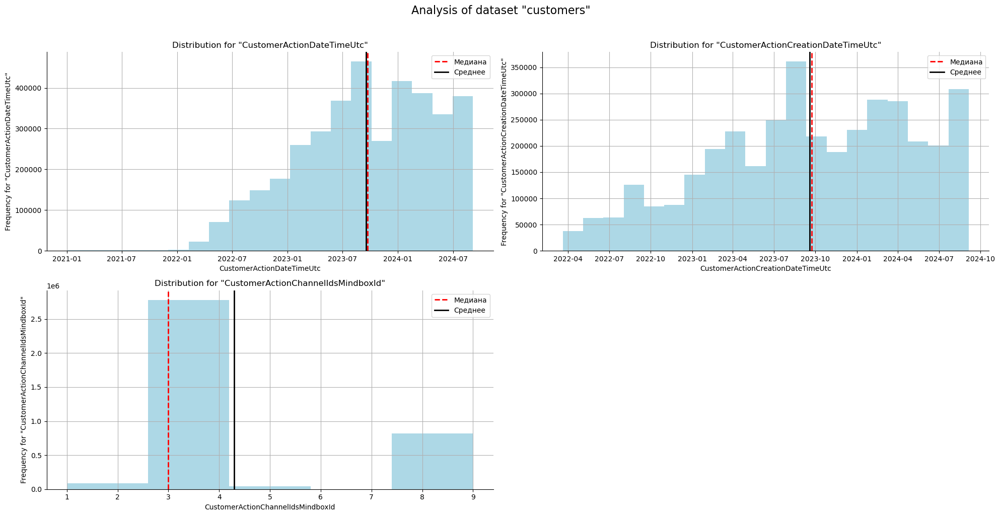

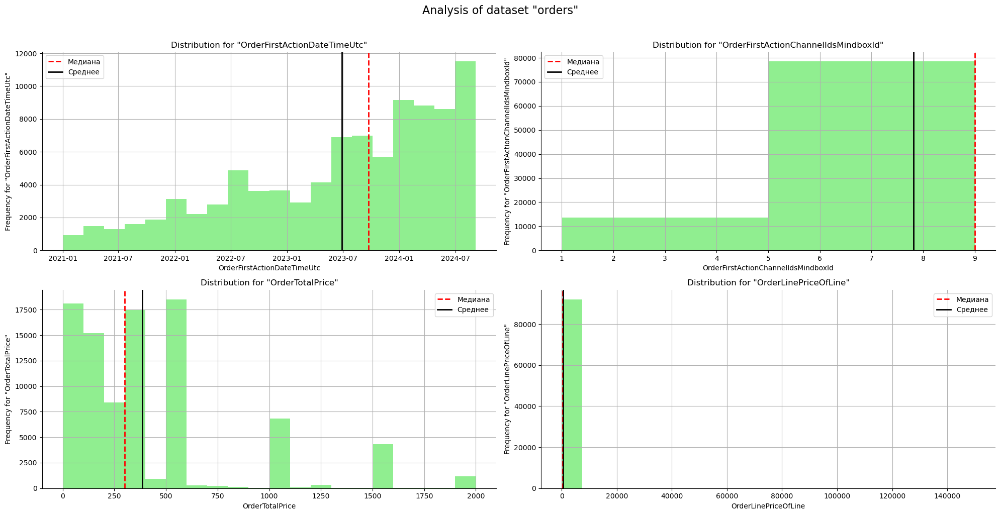

In [6]:
# Remove outliers in certain columns for visualization
percentile_95_orders = np.percentile(orders['OrderTotalPrice'], 95)
percentile_95_customers = np.percentile(customers['CustomerActionChannelIdsMindboxId'], 95)

orders_for_viz = orders.query('`OrderTotalPrice` <= @percentile_95_orders')
customers_for_viz = customers.query('`CustomerActionChannelIdsMindboxId` <= @percentile_95_customers')

exclude_cols = ['CustomerActionIdsMindboxId', 'CustomerActionCustomerIdsMindboxId',
                'OrderIdsMindboxId', 'OrderFirstActionIdsMindboxId', 'OrderCustomerIdsMindboxId']

datasets = [customers_for_viz, orders_for_viz]
names = ['customers', 'orders']
colors = ['lightblue', 'lightgreen']

for dataset, name, color in zip(datasets, names, colors):
    some_functions.histograms(dataset, name, color, exclude_cols)

Histogram Analysis Findings:
- Customers Dataset:
  - CustomerActionDateTimeUtc and CustomerActionCreationDateTimeUtc: the peak activity is around October 2023. This may indicate either a data entry period for previous records or an actual surge in user activity during that time;
  - CustomerActionChannelIdsMindboxId: сhannel 3 shows the highest median value, suggesting it is a leading channel in terms of user actions.
- Orders Dataset:
  - OrderFirstActionDateTimeUtc: the average date is around July 2023, while the median date is closer to October 2023;
  - OrderFirstActionChannelIdsMindboxId: the first recorded entry corresponds to channel ID 9;
  - OrderTotalPrice: the average donation amount is about 500 rubles, with a median of around 300 rubles. Some outliers are present, indicating unusually high donation values.

<span style="color:blue; font-size:17px">Conclusions:</span>

At this stage, we have:
- read the data files;
- combined four user data files into the customers dataset;
- displayed and examined the overall information about the datasets;
- in the customers dataset:
  - removed the columns CustomerActionCustomerIdsWebsiteID, CustomerActionChannelIdsExternalId, CustomerActionCustomerIdsBackendID, CustomerActionBrandIdsSystemName, CustomerActionChannelIdsSystemName, and CustomerActionActionTemplateIdsSystemName;
  - changed the data types of CustomerActionDateTimeUtc and CustomerActionCreationDateTimeUtc to datetime.
- in the orders dataset:
  - removed the columns OrderLineBasePricePerItem, OrderFirstActionChannelIdsExternalId, OrderLineId, OrderLineNumber, OrderCustomFieldsNextPayDate, OrderIdsBackendID, OrderAreaIdsExternalId, OrderCustomerIdsWebsiteID, OrderDeliveryCost, OrderLineLineId, OrderCustomerIdsBackendID, OrderLineGiftCardStatusIdsSystemName, OrderTransactionIdsExternalId, OrderLineLineNumber, and OrderLineGiftCardAmount;
  - changed the data type of OrderFirstActionDateTimeUtc to datetime.
  
Next, we will proceed with the exploratory data analysis.    

[Return to project description](#toc)

<a id="2"></a>
## Exploratory Data Analysis

To conduct the Exploratory Data Analysis (EDA), we will use the ydata_profiling library for generating reports. This library provides a convenient way to create comprehensive reports that summarize the key characteristics of a dataset, making it easier to identify patterns, trends, and potential issues within the data.

<a id="3"></a>
<span style="color:green; font-size:22px">Customers Dataset</span>

In [7]:
# Create a report
customers_report = ProfileReport(customers, title='"customers" dataset report')
customers_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Based on the report, we can draw the following conclusions:
- The percentage of cells with missing data is 41.1%;
- No duplicates were found;
- There are 2 columns with categorical data, 4 columns with text data, 3 columns with numerical data, and 2 columns with date data;
- In the column CustomerActionActionTemplateName, there are about 0.1% unique values;
- In the column CustomerActionDateTimeUtc, the minimum date is January 1, 2021, and the maximum date is September 5, 2024;
- In the column CustomerActionCreationDateTimeUtc, the minimum date is March 20, 2022, and the maximum date is September 4, 2024;
- In the column CustomerActionChannelIdsMindboxId, ids 3 (72.5%) and 9 (21.2%) are the most common;
- In the column CustomerActionChannelName, there are 70 unique values, with email leading (66.6%) and the website in second place (21.5%);
- In the column CustomerActionChannelUtmCampaign, there are 97.9% missing values. It seems this column contains the names of the campaigns for which funds were raised;
- In the column CustomerActionChannelUtmSource, there are also 97.9% missing values. Leading sources include vk, yandex_direct, and roditeli, excluding the administrative site mindbox;
- In the column CustomerActionChannelUtmMedium, 97.9% of the data is missing. This column appears to reflect the resources used to attract donors, with email, cpc, cpa, and sms being the most common;
- In the column channel_content, there is no data available except that 99.2% of it is missing;
- In the column CustomerActionChannelUtmTerm, 99.6% of the data is missing. This likely contains information about collaborations, for example, with bloggers or advertising campaigns. Leading entries include roditeli, razovie, and yandex.ru;
- We will not address the missing values.

Let's clarify some points from the report.

In [8]:
# Take a look at the data in the CustomerActionChannelUtmContent column
customers['CustomerActionChannelUtmContent'].unique()

array([nan, 'video_baza_ignat', 'video-baza-vse', 'video_baza',
       'second-phase', 'kristina_post1_baza', 'video-baza_eva2',
       '12198163705', 'banner', '13320284406', 'baza-post2-1',
       '12591202664', 'knopka2-baza-vse', 'ivanova_post4_baza',
       'dasha-anapa', '13320252197', 'ivanova_klyuch_peresech_post3',
       'video_blagokrat', 'video-danil-blagograkt', 'knopka2-1_zainteres',
       'blagograkt_ignatiy_post4', 'post1-2_zhenya_blagograkt70_interes',
       'novozhilov_zainteres', 'mosyakov_blago70_int', 'post1_demid_baza',
       'baza-post1_1', 'post1-3_zhenya_blagograkt70_interes',
       'romanov_post1_klyuch_int', '12591202663', '12967631185',
       'knopka1-baza-vse', 'video', 'knopka1', 'mosyakov_baza',
       'vid_klyuch_salavat', 'kristina_klyuch_peresech_knopka1',
       'novozhilov_klyuch_peresech', 'ivanova_klyuch_peresech_post4',
       'vid_mosyakov_klyuch_int', 'video-zainteres-zh', 'lal50-post1_2',
       '12590964837', '13320252198', 'igor_post2_bl

In [9]:
customers['CustomerActionChannelUtmContent'].value_counts()

CustomerActionChannelUtmContent
13320252197      675
182369918        464
12591202664      441
12198163705      418
15807018749      388
                ... 
163451376          1
174699279          1
174699406          1
15533247713.0      1
166976315          1
Name: count, Length: 825, dtype: int64

In [10]:
temp = customers.query('CustomerActionChannelUtmContent == "post_ignat_klyuch_int"')

In [11]:
display(temp['CustomerActionDateTimeUtc'].min())
display(temp['CustomerActionDateTimeUtc'].max())

Timestamp('2023-02-10 19:30:00')

Timestamp('2023-05-06 19:42:00')

It seems that the column contains some technical information about the campaign, possibly indicating what type of interaction was made (such as video, button, post, etc.).

Let's look at the minimum and maximum dates of the entries in the columns with missing values.

In [12]:
# List of columns with missing values that we will check
columns_with_na = ['CustomerActionChannelUtmCampaign', 'CustomerActionChannelUtmSource',
                   'CustomerActionChannelUtmMedium', 'CustomerActionChannelUtmContent',
                   'CustomerActionChannelUtmTerm']

# For each column in the list, we check the minimum and maximum dates without missing values
for column in columns_with_na:
    # Filter rows where there are no missing values in this column
    filtered_data = customers[pd.notna(customers[column])]

    # Find the minimum and maximum date
    min_date = filtered_data['CustomerActionDateTimeUtc'].min()
    max_date = filtered_data['CustomerActionDateTimeUtc'].max()

    # Print the result for each column
    print(f"For column {column}:")
    print(f"  Minimun date: {min_date}")
    print(f"  Maximum date: {max_date}\n")

For column CustomerActionChannelUtmCampaign:
  Minimun date: 2022-03-29 08:57:00
  Maximum date: 2024-09-04 20:25:00

For column CustomerActionChannelUtmSource:
  Minimun date: 2022-03-29 08:57:00
  Maximum date: 2024-09-04 20:25:00

For column CustomerActionChannelUtmMedium:
  Minimun date: 2022-03-29 08:57:00
  Maximum date: 2024-09-04 20:25:00

For column CustomerActionChannelUtmContent:
  Minimun date: 2022-04-13 06:38:00
  Maximum date: 2024-09-04 20:15:00

For column CustomerActionChannelUtmTerm:
  Minimun date: 2022-04-02 18:36:00
  Maximum date: 2024-09-04 20:25:00



There is a certain pattern visible: data in these columns started to appear in late March to early April 2022. However, there are still many missing values in the period from spring 2022 to September 2024, and the reason for this is unclear.

<a id="4"></a>
<span style="color:green; font-size:22px">Orders  Dataset</span>

In [13]:
# Create a report
orders_report = ProfileReport(orders, title='"orders" dataset report')
orders_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Based on the report, we can draw the following conclusions:
- The percentage of cells with missing data is 17.8%;
- No duplicates were found;
- There are 4 columns with categorical data, 1 with text data, 5 with numerical data, 1 with date data, and 3 with binary data;
- In the column OrderFirstActionDateTimeUtc, the minimum date is January 1, 2021, and the maximum date is September 5, 2024. By the end of the observed period, we see a significant increase in user activity;
- In the column OrderFirstActionChannelIdsMindboxId, there are only 2 unique values: 9 (85.2%) and 1 (14.8%);
- The column OrderFirstActionChannelName shows the same result: 9 corresponds to the website, and 1 corresponds to the administrative Mindbox site;
- In the column OrderTotalPrice, the minimum value is 0, and the maximum is 1,100,000 rubles. The most common donation amounts are 500 rubles (18.7%), followed by 300 rubles (17.6%) and 100 rubles (12.2%);
- The column OrderCustomFieldsNewyear has 98.1% missing values; the remaining values are True, indicating that people participated in the New Year campaign;
- The column OrderCustomFieldsRecurrent has 12.9% missing values, with 75% being False (non-recurrent) and 12.1% being recurrent;
- In the column OrderCustomFieldsRepayment, there are 91% missing values, with 0.7% indicating no repeat payments and 8.3% indicating that there were repeat payments;
- The column OrderLineProductName has 0.2% missing values;
- In the column OrderLineQuantity, there is one unique value of 1, with no missing values;
- The column OrderLinePriceOfLine has a minimum value of 0 rubles and a maximum value of 1,100,000 rubles. The most common donation amounts are 500 rubles (21.5%), followed by 300 rubles (20.0%) and 100 rubles (13.6%);
- The column OrderLineStatusIdsExternalId has three unique values: Paid (70.9%), notpaid (18.2%), and fail (10.9%);
- We will not address the missing values..

Let's clarify some points from the report.

In [14]:
# Take a look at the top 3 product names
display(orders['OrderLineProductName'].value_counts().head(3))

OrderLineProductName
На уставную деятельность                                                                                                    11539
Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование (хочу помочь)                                       10424
Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»     5180
Name: count, dtype: int64

In [15]:
# Check for missing values in the OrderLineProductName column.
orders[orders['OrderLineProductName'].isnull()]

,OrderIdsMindboxId,OrderFirstActionIdsMindboxId,OrderFirstActionDateTimeUtc,OrderFirstActionChannelIdsMindboxId,OrderFirstActionChannelName,OrderTotalPrice,OrderIdsWebsiteID,OrderCustomFieldsNewyear,OrderCustomFieldsRecurrent,OrderCustomFieldsRepayment,OrderLineProductIdsWebsite,OrderLineProductName,OrderLineQuantity,OrderLinePriceOfLine,OrderLineStatusIdsExternalId,OrderCustomerIdsMindboxId
37,93229,251060,2022-04-21 11:16:00,9,Сайт,10,QNGT2eAlcum233B65c4zeKsVcEuwe3dc,NaN,False,NaN,На уставную деятельность,NaN,1,10,Paid,2861
445,85938,243751,2022-04-02 12:58:00,9,Сайт,100,EVx79XvSloqmQRuhfG68dmopwia88UFp,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,8611
446,88990,246813,2022-05-02 12:58:00,9,Сайт,100,uesmRdYKpfI5eQ10Aw8uCDD8YcvTtb1M,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,8611
447,93385,251216,2022-06-02 12:58:00,9,Сайт,100,Da909agfPEO7Bq7BHf0pIa2aTmlwcUum,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,8611
568,89624,247449,2022-04-21 14:58:00,9,Сайт,100,lRa0g0o7CFdo3ne787wBBwnP3xZMvFeJ,NaN,False,NaN,На уставную деятельность,NaN,1,100,Paid,8764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62218,113891,49742165,2023-04-16 11:57:00,9,Сайт,0,49271,NaN,False,NaN,0,NaN,1,0,Paid,37386
62219,113892,49759657,2023-04-16 13:54:00,9,Сайт,0,49272,NaN,False,NaN,0,NaN,1,0,Paid,37387
62221,113894,49786165,2023-04-16 15:17:00,9,Сайт,0,49274,NaN,False,NaN,0,NaN,1,0,Paid,37389
71604,127145,156197706,2023-09-15 10:06:00,9,Сайт,1,86438,NaN,False,NaN,46056,NaN,1,1,notpaid,40600


In [16]:
# Take a look at the data for the product with the ID "На уставную деятельность"
orders.query('OrderLineProductIdsWebsite == "На уставную деятельность"')

,OrderIdsMindboxId,OrderFirstActionIdsMindboxId,OrderFirstActionDateTimeUtc,OrderFirstActionChannelIdsMindboxId,OrderFirstActionChannelName,OrderTotalPrice,OrderIdsWebsiteID,OrderCustomFieldsNewyear,OrderCustomFieldsRecurrent,OrderCustomFieldsRepayment,OrderLineProductIdsWebsite,OrderLineProductName,OrderLineQuantity,OrderLinePriceOfLine,OrderLineStatusIdsExternalId,OrderCustomerIdsMindboxId
37,93229,251060,2022-04-21 11:16:00,9,Сайт,10,QNGT2eAlcum233B65c4zeKsVcEuwe3dc,NaN,False,NaN,На уставную деятельность,NaN,1,10,Paid,2861
445,85938,243751,2022-04-02 12:58:00,9,Сайт,100,EVx79XvSloqmQRuhfG68dmopwia88UFp,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,8611
446,88990,246813,2022-05-02 12:58:00,9,Сайт,100,uesmRdYKpfI5eQ10Aw8uCDD8YcvTtb1M,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,8611
447,93385,251216,2022-06-02 12:58:00,9,Сайт,100,Da909agfPEO7Bq7BHf0pIa2aTmlwcUum,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,8611
568,89624,247449,2022-04-21 14:58:00,9,Сайт,100,lRa0g0o7CFdo3ne787wBBwnP3xZMvFeJ,NaN,False,NaN,На уставную деятельность,NaN,1,100,Paid,8764
569,91887,249719,2022-06-23 15:45:00,9,Сайт,100,bndwWELP3DohIquySv3NS2fTCJXbgl6F,NaN,False,NaN,На уставную деятельность,NaN,1,100,Paid,8764
718,88986,246809,2022-05-13 13:25:00,9,Сайт,100,KOTuiNBTdIY6oetFATmckuVpcy43ngku,NaN,True,NaN,На уставную деятельность,NaN,1,100,Paid,9165
719,90991,248820,2022-04-13 19:48:00,9,Сайт,100,u73vIw2ypVR8onlHq12nro1jG2itoygC,NaN,False,NaN,На уставную деятельность,NaN,1,100,Paid,9165
720,93577,251408,2022-04-21 11:25:00,9,Сайт,100,0OaZD9FxzWU2kDZL5FHk0rIIXt3S7ocd,NaN,False,NaN,На уставную деятельность,NaN,1,100,Paid,9165
1759,91674,249504,2022-04-12 12:15:00,9,Сайт,300,9H66tSvq0TWCNtdl3atvXui4hoTiLOb1,NaN,False,NaN,На уставную деятельность,NaN,1,300,Paid,10549


In [17]:
# Creating a lookup dictionary from rows where there are no missing values
lookup_dict = orders.dropna(subset=['OrderLineProductName']).set_index('OrderLineProductIdsWebsite')['OrderLineProductName'].to_dict()
# Define a function to output the first n elements of the dictionary
def head_dict(d, n=5):
    return dict(itertools.islice(d.items(), n))

first_5_elements = head_dict(lookup_dict, 5)
first_5_elements

{'9847': 'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Никита Суриков',
 '1': 'На уставную деятельность',
 '4353': 'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Роман Рыбаков',
 '7482': 'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Полина Чинкова',
 '16963': 'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Егор Цуканов'}

It is likely that there has been a mix-up. Instead of the column OrderLineProductName, the data 'На уставную деятельность' was entered in the column OrderLineProductIdsWebsite, instead of the corresponding id=1.

In [18]:
# List of columns with missing values that we will check
columns_with_na = ['OrderCustomFieldsNewyear', 'OrderCustomFieldsRecurrent', 'OrderCustomFieldsRepayment']

# For each column in the list, we check the minimum and maximum dates without missing values
for column in columns_with_na:
    # Filter rows where there are no missing values in this column
    filtered_data = orders[pd.notna(orders[column])]

    # Find the minimum and maximum date
    min_date = filtered_data['OrderFirstActionDateTimeUtc'].min()
    max_date = filtered_data['OrderFirstActionDateTimeUtc'].max()

    # Print the result for each column
    print(f"For column {column}:")
    print(f"  Minimum date: {min_date}")
    print(f"  Maximum date: {max_date}\n")

For column OrderCustomFieldsNewyear:
  Minimum date: 2023-11-13 08:13:00
  Maximum date: 2024-02-09 01:13:00

For column OrderCustomFieldsRecurrent:
  Minimum date: 2022-04-02 12:58:00
  Maximum date: 2024-09-05 10:59:00

For column OrderCustomFieldsRepayment:
  Minimum date: 2023-10-04 09:06:00
  Maximum date: 2024-09-05 10:41:00



It is likely that records for recurrent payments were not kept until April 2022, repeated payments have been reflected in the system since October 2023, and the New Year promotion was launched from November 2023 to February 2024.

In [19]:
# Save the processed datasets to .csv files
# Create a subfolder named datasets_csv in the working directory if it doesn't already exist
output_dir = os.path.join(os.getcwd(), 'datasets_csv')
os.makedirs(output_dir, exist_ok=True)

# Save the processed datasets as .csv files in the datasets_csv subfolder.
customers.to_csv(os.path.join(output_dir, 'customers.csv'), index=False)
orders.to_csv(os.path.join(output_dir, 'orders.csv'), index=False)

print(f'Datasets saved in {output_dir}')

Datasets saved in /Users/marina/Desktop/Аналитик  данных/Мастерская/АиФ_ETL/aif_etl_final/aif_etl/datasets_csv


<span style="color:blue; font-size:17px">Conclusions:</span>

During the exploratory data analysis phase, the following changes and conclusions were made:

- Customers dataset:
  - Analyzed general information about the dataset;
  - Examined unique values in the columns;
  - No duplicates were found;
  - Missing values (41.1% of the data) were identified in 5 columns that store information about marketing actions, sources of engagement, etc. The missing values were left unchanged, as they are likely related to a lack of information, possibly because data were not collected for some period.
- Orders dataset:
  - Analyzed general information about the dataset;
  - Examined unique values in the columns;
  - It is possible that instead of being recorded in the OrderLineProductName column, the data "На уставную деятельность" was entered into the OrderLineProductIdsWebsite column as an ID, which creates confusion in the data;
  - No duplicates were found;
  - Missing values (17.8% of the data) were identified in 3 columns. The missing values were left unchanged, as they are likely related either to a lack of user information or to the fact that only users for whom the binary columns had a true value were marked.  
- Processed files were saved in .csv format.

[Return to project description](#toc)

<a id="5"></a>
## Target Data Analysis

<a id="6"></a>
<span style="color:green; font-size:22px">User Metrics</span>

In [20]:
# Number of unique users in Customers
some_functions.execute_query(sqls_script.unique_users_in_customers_count)

,unique_users_customers
0,28633


In [21]:
# Number of unique users in Orsers
some_functions.execute_query(sqls_script.unique_users_in_orders_count)

,unique_users_orders
0,26206


We can see that the number of users in orders and customers does not match

In [22]:
# Find the number of users whose IDs do not match in both datasets
some_functions.execute_query(sqls_script.non_matched_users_count)

,order_year,unique_user_count,source
0,None,2457,customers_only
1,2024,30,orders_only


This is likely a technical error or that there is no order data for all users.

<span style="color:blue; font-size:15px">New Year Promotion</span>

In [23]:
# Take a look at the dates of the New Year promotion
some_functions.execute_query(sqls_script.new_years_action_date)

,newyear_start,newyear_end
0,2023-11-13 08:13:00,2024-02-09 01:13:00


The New Year's campaign started on November 13, 2023, and ended on February 9, 2024.

In [24]:
# Count the number of unique users participating in the New Year promotion
some_functions.execute_query(sqls_script.unique_new_years_users_count)

,user_count_newyear
0,1210


In [25]:
# Calculate the percentage of participants out of the total number of user
some_functions.execute_query(sqls_script.percent_participated_newyear)

,percent_participated_newyear
0,4.62


In [26]:
# Calculate the number of unique users participating in the New Year's promotion by the year of their first 
# activity, as well as the total amount of expected contributions, the amount of paid contributions, and 
# the payment capability in percentage
some_functions.execute_query(sqls_script.active_new_year_users_cnt_by_year)

,active_year,user_count,total_planned_donations,paid_donations,total_donations_percentage
0,2021,184,2841885,2430176,85.51
1,2022,293,3507368,2852069,81.32
2,2023,679,2520371,1813748,71.96
3,2024,54,111885,84630,75.64


The following conclusions can be drawn:
- Users who participated in the New Year's campaign were attracted in different years, but the most active ones were those who came in 2023;
- Not all donations added to the cart were paid;
- Among the so-called "historical" users, the percentage of paid donations is significantly higher than among those who came in 2023 and 2024, for example.

In [27]:
# Count users who participated in the New Year's promotion returned after it
some_functions.execute_query(sqls_script.cnt_returned_after_ny_users)

,post_newyear_user_count
0,869


In [28]:
# Count users who showed their first activity during the New Year's promotion and made their first donation 
# specifically for it
cnt_users_donated_first_time_during_ny_action = \
some_functions.execute_query(sqls_script.cnt_users_donated_first_time_during_ny_action)
cnt_users_donated_first_time_during_ny_action

,newyear_user_count
0,634


In [29]:
# Count how many of them returned with a repeat payment
cnt_returned_users_donated_first_time_during_ny_action = \
some_functions.execute_query(sqls_script.cnt_returned_users_donated_first_time_during_ny_action)
cnt_returned_users_donated_first_time_during_ny_action

,users_with_repeat_payment
0,154


In [30]:
# Calculate the percentage of users who returned with a second payment from the total number of users 
# who participated in the New Year's campaign with their first donation
cnt_returned_users_donated_first_time_during_ny_action['users_with_repeat_payment']\
/cnt_users_donated_first_time_during_ny_action['newyear_user_count'] * 100

0    24.290221
dtype: float64

About 24% of users who made their first donation during the New Year's campaign returned afterward. That sounds very good.

<span style="color:blue; font-size:15px">Recurring Users and Repeat Payments</span>

In [31]:
# Count the number of recurring users
some_functions.execute_query(sqls_script.unique_recurrents_count)

,recurrents_count
0,1437


In [32]:
# Count the number of recurring users by year
some_functions.execute_query(sqls_script.unique_recurrents_users_cnt_by_year)

,first_payment_year,recurrent_users_count
0,2022,679
1,2023,460
2,2024,298


Unfortunately, the number of recurrent donors is not increasing year after year.

In [33]:
# Count the number of users who made more than one payment, excluding recurring users
some_functions.execute_query(sqls_script.users_count_more_than_one_order_without_recurrents)

,users_with_repeat_payment
0,9430


About a third of the unique users returned to make at least one more donation.

In [34]:
# Calculate the average number of days between payments for users who made more than one payment but are not 
# recurring users
some_functions.execute_query(sqls_script.avg_days_between_orders_without_recurrents)

,overall_avg_days_between_payments
0,111.23


Users return to make a donation on average once every three and a bit months.

In [35]:
# Calculate the number of users who made at least one payment based on their source of arrival to the fund
cnt_paid_users_by_source = some_functions.execute_query(sqls_script.cnt_paid_users_by_source)
cnt_paid_users_by_source.head(15)

,user_source,2021,2022,2023,2024,total
0,Сайт,0,3490,4773,4972,13235
1,Административный сайт Mindbox,4019,1580,745,892,7236
2,utm_term Не указан,0,1010,1867,2514,5391
3,Прямой переход,0,1309,1336,1138,3783
4,vk.com,0,182,751,407,1340
5,instagram.com,0,188,451,321,960
6,yandex.ru,0,249,200,277,726
7,roditeli,0,304,0,0,304
8,ida,0,267,0,0,267
9,google.com,0,48,88,91,227


This table clearly shows that the main source of user acquisition in all years is the foundation's website, and the number of attracted users has been growing year by year. Various social media channels perform much worse, with VK, Instagram, and Yandex leading among them.

In [36]:
# Find the average number of days between users' repeat payments
some_functions.execute_query(sqls_script.avg_days_between_repeated_orders)

,avg_days_between_1_and_2_payments
0,90


On average, users return about 3 months after their first payment to make a second one.

<span style="color:blue; font-size:15px">Unpaid Payments and Payment Errors</span>

In [37]:
# Count the number of payments by payment status
some_functions.execute_query(sqls_script.count_orders_by_status)

,payment_status,count_payments
0,Paid,68508
1,notpaid,17575
2,fail,10482


Just under a third of payments were either not completed or encountered an error during the payment process.

In [38]:
# Count the number of payments by payment status, broken down by year
some_functions.execute_query(sqls_script.count_orders_by_status_per_year)

,payment_status,2021,2022,2023,2024
0,Paid,9359,14950,20395,23804
1,fail,0,1612,3724,5146
2,notpaid,0,2824,7255,7496


In 2021, we have no data on unpaid orders. Then, in 2023, there is a significant increase in unpaid orders and payment errors, and in 2024, the number of errors and unpaid orders increases even more.

In [39]:
# Count the number of unique users by payment status
some_functions.execute_query(sqls_script.unique_users_cnt_by_payment_status)

,payment_status,unique_user_count
0,Paid,22818
1,notpaid,8252
2,fail,3943


There are likely overlaps among users; there are probably the same individuals who have both successful and unsuccessful payments.

In [40]:
# Look for intersections in user groups by payment status
some_functions.execute_query(sqls_script.intersections_users_cnt_by_payment_status)

,status_count,user_count
0,1,19004
1,2,5507
2,3,1665


Indeed, the same user has both made successful payments and may have encountered errors or not completed the payment process.

In [41]:
# Count the number of unique users by payment status, broken down by year
some_functions.execute_query(sqls_script.unique_users_cnt_by_payment_status_per_year)

,payment_status,2021,2022,2023,2024
0,Paid,4019,7022,8346,9351
1,fail,0,1124,1508,1701
2,notpaid,0,1524,3597,4190


The number of users experiencing payment errors increased after 2022, and the number of unpaid transactions more than doubled. This issue is likely related to complications with bank transfers (possibly from abroad) due to sanctions.

In [42]:
# Look at the total estimated amount, the amount of paid orders, unpaid orders, and payment errors by year
some_functions.execute_query(sqls_script.revenue_by_payment_status_and_total_revenue)

,financial_year,total_amount,total_paid,total_not_paid,total_failed
0,2021,7583698,7583698,0,0
1,2022,18868378,10441595,8426783,0
2,2023,32592617,15687033,16905584,0
3,2024,27036445,17968806,9067639,0


We see that in 2023, the amount of unpaid orders doubled and exceeds the amount of paid orders. It is likely that the amounts for failed payments are not retained. Based on this, we might conclude that there was a retry of the payment in such cases, which was successful.

In [43]:
# Look at the maximum donation amount, the maximum paid and unpaid amounts
some_functions.execute_query(sqls_script.max_sum_donated)

,max_order_amount,max_paid_order_amount,max_not_paid_order_amount
0,1100000,200000,1100000


The foundation had an attempted donation of 1,100,000 rubles, but for some reason, the donor changed their mind and did not transfer the money.

In [44]:
# Count how many payments were above the average of 500 rubles and below the maximum of 200,000 rubles
some_functions.execute_query(sqls_script.cnt_payment_500_200000)

,paid_orders_count
0,13847


In [45]:
# Count how many unpaid payments were above the average of 500 rubles and below the maximum of 200,000 rubles
some_functions.execute_query(sqls_script.cnt_not_paid_order_500_200000)

,paid_orders_count
0,4503


The number of unpaid orders is indeed very high, about a third in this price segment. For some reason, users do not complete the donation process.

<span style="color:blue; font-size:15px">Channels of Acquisition</span>

In [46]:
# Find the top 5 user acquisition channels by year among the data that has information available
some_functions.execute_query(sqls_script.top_5_channels_by_year)

,source,2021,2022,2023,2024
0,aif_gazeta,0,0,342,0
1,edna,0,0,0,547
2,instagram,0,803,0,0
3,marketolog,0,275,340,0
4,mindbox,0,1528,3355,2766
5,mtsmarketolog,0,0,0,453
6,vk,0,953,2539,3886
7,yandex-direct,0,931,442,687


There is no data for 2021. Excluding the administrative site of Mindbox, VK leads in all years. At the same time, we see significant growth in 2023 and 2024. Instagram, on the other hand, has dropped out of the top five leaders since 2022.

In [47]:
# Count how many payments were made through each of these channels and calculate the average check per user
some_functions.execute_query(sqls_script.cnt_orders_by_channel)

,year,source,user_count,total_paid_orders,avg_check_per_user
0,2022,instagram,803,6101,2964.96
1,2022,yandex-direct,931,10012,660.36
2,2022,mindbox,1528,106943,435.67
3,2022,marketolog,275,21299,348.16
4,2022,vk,953,16730,265.62
5,2023,aif_gazeta,342,10801,1435.69
6,2023,mindbox,3355,286153,446.44
7,2023,yandex-direct,442,5178,342.68
8,2023,marketolog,340,20784,279.87
9,2023,vk,2539,116013,259.53


The table clearly shows that, despite VK's leadership in attracting users, their average donation amount is the lowest. However, it must be acknowledged that they still contribute significantly to the overall fundraising total due to their numbers. Instagram led in average donation amount in 2022. AIF Gazeta and Yandex Direct appear to be very promising avenues for development in 2023 and 2024.

<span style="color:blue; font-size:17px">Analysis of DAU, MAU, WAU, sticky factor</span>

In [48]:
# Analyze DAU, MAU, WAU, weekly and monthly sticky factor by year
some_functions.execute_query(sqls_script.dau_wau_mau_sticky_by_year)

,year,avg_dau,avg_wau,avg_mau,sticky_factor_mau,sticky_factor_wau
0,2021,24.39,163.08,666.33,3.66,14.96
1,2022,43.94,281.00,1136.33,3.87,15.64
2,2023,66.00,404.09,1543.00,4.28,16.33
3,2024,114.90,692.56,2344.00,4.90,16.59
4,Total,57.87,358.38,1360.98,4.25,16.15


DAU, MAU, WAU:
- Users in 2024 show higher activity, which may indicate successful marketing campaigns.
  
Sticky Factors:
- User stickiness in 2024 is also higher.

In [49]:
# Analyze DAU, MAU, and WAU dynamics by month
dau_wau_mau_sticky_by_month = some_functions.execute_query(sqls_script.dau_wau_mau_sticky_by_month)

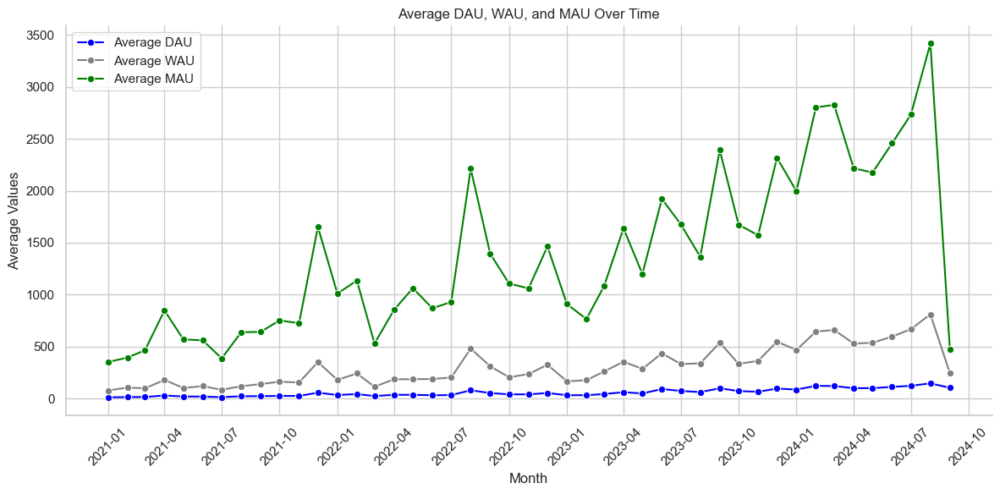

In [50]:
# Convert the 'month' column to datetime for convenience
df = dau_wau_mau_sticky_by_month
df['month'] = pd.to_datetime(df['month'])

# Set the style of the plot
sns.set(style="whitegrid")

# Create a line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='month', y='avg_dau', marker='o', label='Average DAU', color='blue')
sns.lineplot(data=df, x='month', y='avg_wau', marker='o', label='Average WAU', color='grey')
sns.lineplot(data=df, x='month', y='avg_mau', marker='o', label='Average MAU', color='green')

# Set major ticks on the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 

# Configuring the plot
plt.title('Average DAU, WAU, and MAU Over Time')
plt.xlabel('Month')
plt.ylabel('Average Values')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
sns.despine()

# Show the plot
plt.show()

[Return to project description](#toc)

<a id="7"></a>
<span style="color:green; font-size:22px">Marketing metrics</span>

<span style="color:blue; font-size:17px">Analysis of CR (Conversion Rate)</span>

In [51]:
# Calculate the Conversion Rate from user to customer
some_functions.execute_query(sqls_script.cr_user_to_customer)

,unique_users,paying_users_count,conversion_rate
0,28633,22840,79.77


The conversion rate from an interested user to a paying user is approximately 80%.

In [52]:
# Calculate the Conversion Rate from user to customer by month
cr_user_to_customer_by_month = some_functions.execute_query(sqls_script.cr_user_to_customer_by_month)

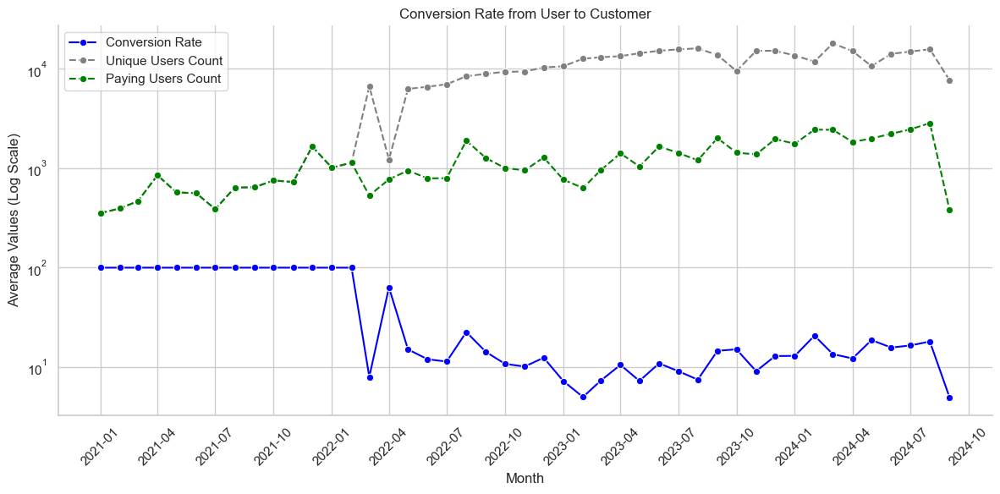

In [53]:
# Convert the 'month' column to datetime for convenience
df = cr_user_to_customer_by_month
df['month'] = pd.to_datetime(df['month'])

plt.figure(figsize=(12, 6))

# Use logarithmic scale for the Y-axis
plt.yscale('log')

# Line for conversion_rate
sns.lineplot(data=df, x='month', y='conversion_rate', marker='o', label='Conversion Rate', color='blue')
sns.lineplot(data=df, x='month', y='unique_users', marker='o', label='Unique Users Count', color='gray', 
             linestyle='--', markersize=6)
sns.lineplot(data=df, x='month', y='paying_users_count', marker='o', label='Paying Users Count', color='green', 
             linestyle='--', markersize=6)

# Set major ticks on the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 

# Plot settings
plt.title('Conversion Rate from User to Customer')
plt.xlabel('Month')
plt.ylabel('Average Values (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
sns.despine()

# Show the plot
plt.show()

Here we see an interesting situation. Likely, until February 2022, only paying users were loaded into the database, and statistics on non-paying users were not kept, which is why the conversion rate of about 80% probably does not reflect the true situation. Let's recalculate it, taking this fact into account.

In [54]:
# Calculate the average conversion rate from users to customers, excluding months with a CR of 100%
some_functions.execute_query(sqls_script.cr_user_to_customer_without_100)

,average_conversion_rate
0,13.87


And the situation is significantly less optimistic, with the conversion rate (CR) now at 13.9%.

<span style="color:blue; font-size:17px">CLV (Customer Lifetime Value) Analysis</span>

In [55]:
# Calculate the average Customer Lifetime Value of customers by year
some_functions.execute_query(sqls_script.avg_clv_users_by_year)

,order_year,average_clv
0,2021,1373.98
1,2022,1708.15
2,2023,2015.32
3,2024,1824.08


Considering that our data for 2024 is incomplete, we can say that the lifetime value of users is increasing year by year.

[Return to project description](#toc)

<a id="8"></a>
<span style="color:green; font-size:22px">Commercial metrics</span>

<span style="color:blue; font-size:17px">Total Revenue</span>

In [56]:
# Calculate the total amount of donations
some_functions.execute_query(sqls_script.total_donate)

,total_donate
0,51681132


In [57]:
# Calculate the total amount of donations for each year
some_functions.execute_query(sqls_script.total_donate_by_year)

,financial_year,total_donate
0,2024,17968806
1,2023,15687033
2,2022,10441595
3,2021,7583698


We can see that the total amount of funds raised is increasing each year.

<span style="color:blue; font-size:17px">ARPU (Average Revenue per User)</span>

In [58]:
# Calculate ARPU by year
some_functions.execute_query(sqls_script.arpu_by_year)

,year,total_income,total_users,arpu
0,2021,7583698,4019,1886
1,2022,10441595,12847,812
2,2023,15687033,20227,775
3,2024,17968806,25757,697


In [59]:
# Calculate ARPU monthly by year
arpu_by_month_per_year = some_functions.execute_query(sqls_script.arpu_by_month_per_year)

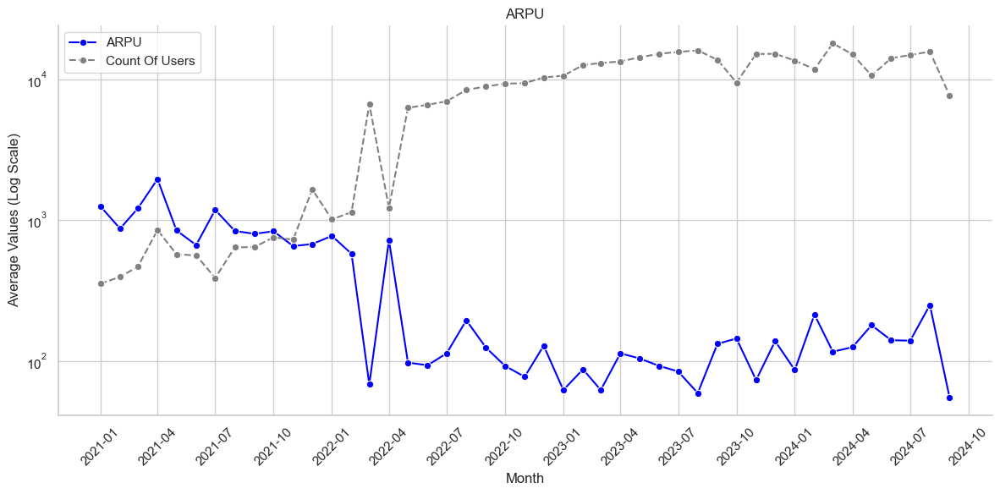

In [60]:
# Convert the 'month' column to datetime for convenience
df = arpu_by_month_per_year
df['month'] = pd.to_datetime(df['year_month'])

plt.figure(figsize=(12, 6))

# Use logarithmic scale for the Y-axis
plt.yscale('log')

# Line for conversion_rate
sns.lineplot(data=df, x='month', y='arpu', marker='o', label='ARPU', color='blue')
sns.lineplot(data=df, x='month', y='total_users', marker='o', label='Count Of Users', color='gray', 
             linestyle='--', markersize=6)

# Set major ticks on the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 

# Plot settings
plt.title('ARPU')
plt.xlabel('Month')
plt.ylabel('Average Values (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
sns.despine()

# Show the plot
plt.show()

<span style="color:blue; font-size:17px">ARPRU (Average Revenue per Paying User)</span>

In [61]:
# Calculate ARPPU by year
some_functions.execute_query(sqls_script.arppu_by_year)

,year,total_income,paying_users_count,arppu
0,2021,7583698,4019,1886
1,2022,10441595,7022,1486
2,2023,15687033,8346,1879
3,2024,17968806,9373,1917


The average donation per paying user is definitely higher than the ARPU. We can see that in 2022, the average donation significantly decreased compared to even 2021. In 2023, it approached the amount from 2021, and in 2024, it slightly exceeded it.

In [62]:
# Calculate ARPPU monthly by year
arppy_by_month_per_year = some_functions.execute_query(sqls_script.arppy_by_month_per_year)

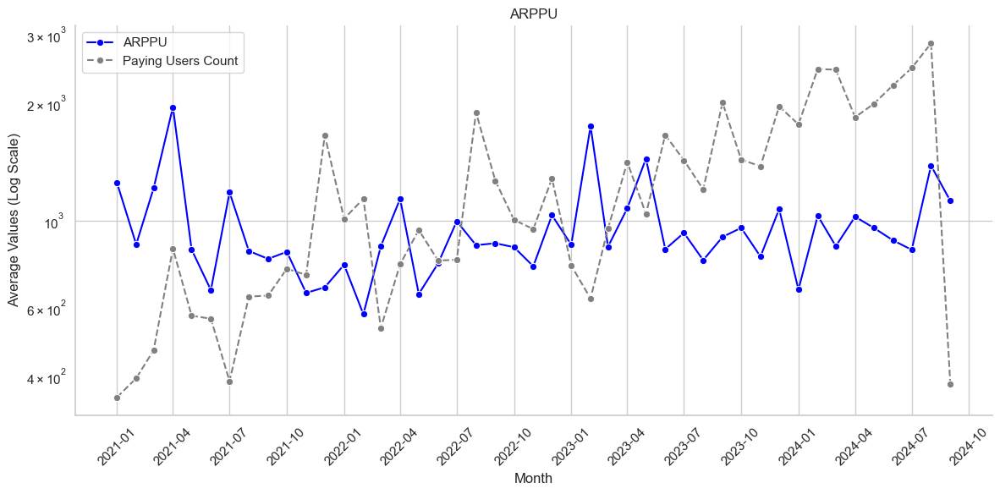

In [63]:
# Convert the 'month' column to datetime for convenience
df = arppy_by_month_per_year
df['month'] = pd.to_datetime(df['year_month'])

plt.figure(figsize=(12, 6))

# Use logarithmic scale for the Y-axis
plt.yscale('log')

# Line for ARPPU
sns.lineplot(data=df, x='month', y='arppu', marker='o', label='ARPPU', color='blue')
sns.lineplot(data=df, x='month', y='paying_users_count', marker='o', label='Paying Users Count', 
             color='gray', linestyle='--', markersize=6)

# Set major ticks on the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))  

# Plot settings
plt.title('ARPPU')
plt.xlabel('Month')
plt.ylabel('Average Values (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
sns.despine()

# Show the plot
plt.show()


<span style="color:blue; font-size:17px">Average Check</span>

In [64]:
# Calculate the average check by year
some_functions.execute_query(sqls_script.avg_check_by_year)

,year,average_check
0,2021,810.31
1,2022,698.43
2,2023,769.16
3,2024,754.86
4,Total,754.38


In [65]:
#  Сalculate how much time passes for users between the first and last payment, and the average number of payments 
# per user
some_functions.execute_query(sqls_script.avg_orders_by_user_avg_time)

,avg_days_between_first_last_pay,average_payments_per_user
0,108.91,3.0


On average, a user's lifetime is about 108 days, during which they make 3 payments.

In [66]:
# Calculate the average check per day across all data
some_functions.execute_query(sqls_script.avg_check_by_all_years)

,overall_average_check
0,759.35


Thus, the average daily revenue across the entire dataset is approximately 759 rubles.

[Return to project description](#toc)

<a id="9"></a>
<span style="color:green; font-size:22px">RFM Analysis</span>

Let's prepare the data for RFM.

In [67]:
rfm = some_functions.execute_query(sqls_script.rfm)
rfm.head()

,customer_id,recency_days,order_frequency_per_month,total_spent,recency_score,frequency_score,monetary_score,RFM,percentage_RFM,segment_name,segment_description
0,20071,1183,2.432432,4000,1,1,1,111,0.01,One-time donors,Inactive clients with low transfer frequency and small donation amounts
1,22178,988,2.142857,3000,1,1,1,111,0.01,One-time donors,Inactive clients with low transfer frequency and small donation amounts
2,7805,1294,2.307692,4220,1,1,2,112,0.02,Prospective clients,Inactive clients with low transfer frequency and medium donation amounts
3,17828,949,1.648352,6000,1,1,2,112,0.02,Prospective clients,Inactive clients with low transfer frequency and medium donation amounts
4,23469,1206,1.818182,4500,1,1,2,112,0.02,Prospective clients,Inactive clients with low transfer frequency and medium donation amounts


In [68]:
# Grouping by RFM and calculating mean and count
segments_description = rfm.groupby('segment_name').agg({'RFM': lambda x: list(set(x)),
                            'customer_id': 'nunique',
                            'recency_days': 'mean',
                            'order_frequency_per_month': 'mean',
                            'total_spent': 'mean'}).reset_index().rename(columns={
                                'customer_id': 'unique_users_count',
                                'recency_days': 'avg_days_between_orders',
                                'order_frequency_per_month': 'avg_orders_count',
                                'total_spent': 'avg_donation_sum',
                                'RFM': 'rfm_subsegments'
                            })
# Calculate total income for each segment
total_income_per_segment = rfm.groupby('segment_name')['total_spent'].sum().reset_index()
total_income_per_segment = total_income_per_segment.rename(columns={'total_spent': 'total_segment_income'})

# Merge data with the main DataFrame
segments_description = segments_description.merge(total_income_per_segment, on='segment_name', how='left')
segments_description = segments_description.style.highlight_max(subset=['unique_users_count', 
                                                                        'total_segment_income', 
                                                                        'avg_days_between_orders',
                                                                        'avg_orders_count',
                                                                        'avg_donation_sum'], 
                                                                color='lightblue')
segments_description

,segment_name,rfm_subsegments,unique_users_count,avg_days_between_orders,avg_orders_count,avg_donation_sum,total_segment_income
0,Growth potential clients,['231'],13,646.307692,15.403846,2969.307692,38601
1,Highly active,"['331', '321', '322']",37,143.054054,13.977751,3161.000000,116957
2,Key clients,"['323', '243', '233', '333', '343', '143', '133']",1102,259.433757,2.381674,23274.313067,25648293
3,Lost clients,"['134', '314', '313', '334', '332', '212']",493,185.592292,7.061855,6283.991886,3098008
4,Moderately active,"['114', '224', '222', '234', '324', '132', '124']",174,526.103448,6.792149,894.890805,155711
5,One-time donors,"['121', '211', '131', '221', '311', '111']",65,306.092308,2.982493,3000.261538,195017
6,Prospective clients,"['213', '113', '232', '112', '122', '214', '312']",115,498.391304,2.358219,6377.339130,733394
7,Rarely active,"['144', '141', '244', '341', '342', '444', '344', '242', '241', '142']",20753,461.869465,0.477750,860.731653,17862764


In [69]:
# Export user IDs by RFM segments for further use by the customer in a .csv file
customers_id_by_rfm_segments = rfm.groupby('RFM')['customer_id'].apply(list).reset_index()
customers_id_by_rfm_segments.to_csv('customers_id_by_rfm_segments.csv', index=False)

In [70]:
# Creating a table with all RFM segments
some_functions.execute_query(sqls_script.rfm_segments)

,rfm_segment,users_count_in_segment,avg_lifetime,avg_orders_count,mean_donation_per_user,total_donation_sum,segment_name,segment_description
0,333,34,164.35,35.91,57513.79,1955469,Key clients,Active clients with high transfer frequency and high donation amounts
1,233,13,677.00,23.36,29453.08,382890,Key clients,Relatively active clients with high transfer frequency and high donation amounts
2,332,10,243.80,21.24,5433.60,54336,Lost clients,Active clients with high transfer frequency and medium donation amounts
3,132,2,1057.00,20.00,5250.00,10500,Moderately active,Inactive clients with high transfer frequency and medium donation amounts
4,331,26,158.35,18.30,3028.96,78753,Highly active,Active clients with high transfer frequency and small donation amounts
5,134,26,1090.38,17.49,618.00,16068,Lost clients,Inactive clients with high transfer frequency and extremely small donation amounts
6,334,132,162.09,16.17,806.57,106467,Lost clients,Active clients with high transfer frequency and extremely small donation amounts
7,231,13,646.31,15.40,2969.31,38601,Growth potential clients,Relatively active clients with high transfer frequency and small donation amounts
8,234,48,629.38,14.96,822.67,39488,Moderately active,Relatively active clients with high transfer frequency and extremely small donation amounts
9,133,5,1069.80,14.69,33810.00,169050,Key clients,Inactive clients with high transfer frequency and high donation amounts


We segmented the users. The best segments are 333, 133, 323, 233, 243, 143, 343: these users frequently visit the website, often donate money, and have high transaction amounts. Segments 213, 112, 232, 214, 122, 113, 312 are also noteworthy. Segments 331, 321, 322 consist of often but law donations.

[Return to project description](#toc)

<a id="10"></a>
<span style="color:green; font-size:22px">Cohort Analysis</span>

<span style="color:blue; font-size:17px">Retention rate</span>

In [71]:
rr = some_functions.execute_query(sqls_script.rr)
# Rearranges the columns of a DataFrame by keeping the first two columns in place and reversing 
# the order of the remaining columns
rr = some_functions.rearrange_columns(rr)
rr

,cohort,n_customers_start,2024-09,2024-08,2024-07,2024-06,2024-05,2024-04,2024-03,2024-02,2024-01,2023-12,2023-11,2023-10,2023-09,2023-08,2023-07,2023-06,2023-05,2023-04,2023-03,2023-02,2023-01,2022-12,2022-11,2022-10,2022-09,2022-08,2022-07,2022-06,2022-05,2022-04,2022-03,2022-02,2022-01,2021-12,2021-11,2021-10,2021-09,2021-08,2021-07,2021-06,2021-05,2021-04,2021-03,2021-02,2021-01
0,2021-01,353,3.7,17.8,17.6,18.1,17.0,15.3,17.3,16.1,15.9,15.6,18.7,16.7,16.4,16.7,15.0,13.3,9.1,9.6,7.6,6.5,6.5,13.3,33.1,33.1,35.4,36.5,7.6,9.9,8.2,9.1,27.8,43.9,45.0,46.2,44.5,45.6,49.0,48.4,46.2,50.7,52.1,56.1,60.3,63.5,100.0
1,2021-02,171,1.8,10.5,14.0,13.5,12.9,15.2,15.2,15.2,14.0,12.3,15.2,15.8,14.6,13.5,17.5,14.0,13.5,12.3,10.5,5.8,8.2,11.7,18.7,21.1,19.9,21.1,15.2,10.5,12.3,9.9,14.0,24.6,21.1,27.5,19.9,28.1,24.0,27.5,20.5,22.2,24.6,28.7,31.0,100.0,NaN
2,2021-03,200,3.5,11.5,11.5,11.5,12.0,11.5,11.5,13.5,8.5,11.0,11.0,12.5,12.5,11.5,10.5,13.5,6.5,3.0,6.5,3.5,6.0,9.5,12.5,15.5,13.0,13.5,9.0,8.5,6.5,7.5,10.5,15.5,16.0,20.0,12.0,17.5,18.0,19.0,13.0,19.5,17.0,25.5,100.0,NaN,NaN
3,2021-04,551,1.3,6.4,5.3,6.0,6.4,6.2,6.5,6.0,5.8,4.2,6.7,6.2,5.6,7.3,5.8,4.9,5.6,3.3,3.6,2.4,4.5,5.4,6.5,6.9,7.4,7.1,4.4,5.3,3.3,4.2,4.9,7.3,7.1,9.4,5.8,5.6,7.1,8.7,6.5,8.5,8.7,100.0,NaN,NaN,NaN
4,2021-05,263,1.5,4.9,4.9,5.3,7.2,6.8,5.7,5.3,4.9,5.3,3.8,6.5,6.1,6.5,5.7,5.7,5.3,3.0,4.2,3.8,2.7,3.0,8.7,10.3,10.6,9.9,3.0,5.7,4.2,2.7,6.8,11.4,10.6,12.2,11.4,16.7,11.0,14.4,10.3,14.1,100.0,NaN,NaN,NaN,NaN
5,2021-06,221,1.4,7.2,7.7,6.8,6.8,6.3,8.6,6.8,7.2,8.6,6.8,7.7,6.3,6.8,8.1,5.0,4.5,4.1,5.9,3.2,4.1,5.0,9.0,10.0,8.6,9.0,4.1,4.5,5.0,2.3,9.5,12.2,11.8,14.5,10.0,12.2,12.7,16.3,15.8,100.0,NaN,NaN,NaN,NaN,NaN
6,2021-07,66,1.5,12.1,10.6,10.6,10.6,9.1,9.1,10.6,12.1,3.0,12.1,13.6,13.6,10.6,13.6,9.1,4.5,9.1,4.5,1.5,4.5,10.6,13.6,15.2,15.2,16.7,4.5,7.6,6.1,3.0,15.2,18.2,22.7,21.2,27.3,25.8,25.8,22.7,100.0,NaN,NaN,NaN,NaN,NaN,NaN
7,2021-08,246,1.2,9.8,8.5,10.6,10.2,11.8,12.2,9.8,10.2,8.9,8.1,9.3,10.6,8.9,9.3,8.9,11.4,5.3,7.3,4.5,4.1,7.7,8.5,10.2,11.4,11.0,6.5,5.7,7.3,5.7,8.1,13.0,12.6,16.7,13.0,13.4,14.2,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2021-09,245,0.4,8.6,8.2,10.6,11.8,9.8,11.0,9.8,11.0,9.4,9.0,9.8,9.4,11.4,8.2,11.0,6.1,2.4,4.1,4.1,2.4,6.9,10.6,10.6,13.5,14.3,9.8,8.6,5.3,6.1,6.9,12.7,17.1,17.1,13.5,14.7,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2021-10,321,1.2,7.5,7.5,9.0,8.1,7.8,10.6,8.1,9.3,7.5,8.4,9.7,9.7,10.3,10.6,8.7,7.2,4.4,5.6,3.1,2.8,5.0,10.9,9.3,10.0,11.5,4.4,4.0,2.8,4.0,7.5,12.5,15.9,19.9,14.6,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


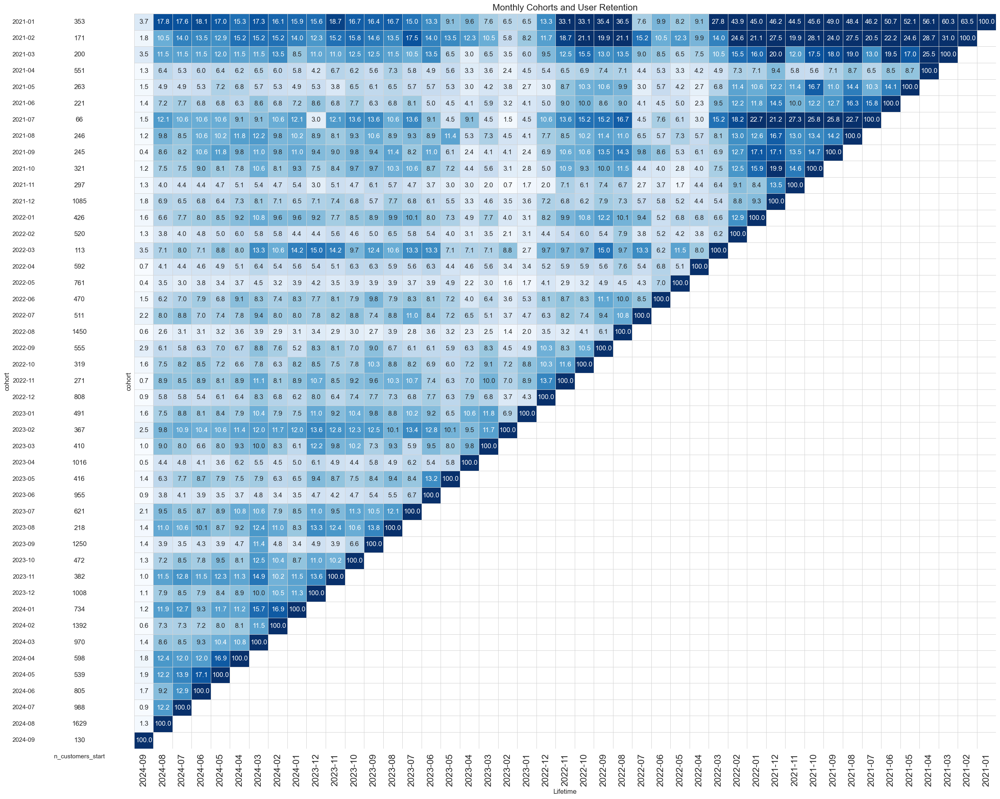

In [72]:
# Visualize the retention rate matrix
# Set 'cohort' as the index
rr.set_index('cohort', inplace=True)
    
retention_values = rr.drop(columns=['n_customers_start'])

# Set up the color map with defined limits
with sns.axes_style("white"):
    fig, ax = plt.subplots(1, 2, figsize=(25, 20), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

    # Heatmap for the retention matrix
    sns.heatmap(retention_values,
                mask=retention_values.isnull(),
                annot=True,
                fmt='.1f',
                cmap='Blues',
                ax=ax[1],
                vmin=1,  
                vmax=20, 
                linewidths=0.5,
                linecolor='lightgrey',
                cbar=False)
    ax[1].set_title('Monthly Cohorts and User Retention', fontsize=16)
    ax[1].set(xlabel='Lifetime')
    ax[1].tick_params(axis='x', labelsize=16) 
    ax[1].tick_params(axis='y', labelsize=16)

    # Cohort size
    cohort_size_df = rr[['n_customers_start']]
    white_cmap = mcolors.ListedColormap(['white'])
    sns.heatmap(cohort_size_df,
                annot=True,
                cbar=False,
                fmt='g',
                cmap=white_cmap,
                ax=ax[0])

    fig.tight_layout()
    plt.show()

In [73]:
# Calculate the average RR monthly
rr_by_month_per_year = some_functions.execute_query(sqls_script.rr_by_month_per_year)
rr_by_month_per_year

,cohort_month,total_users,average_retention_rate
0,2021-01,353,27.92
1,2021-02,171,18.62
2,2021-03,200,14.00
3,2021-04,551,8.09
4,2021-05,263,9.33
5,2021-06,221,10.06
6,2021-07,66,14.30
7,2021-08,246,11.74
8,2021-09,245,11.79
9,2021-10,321,10.82


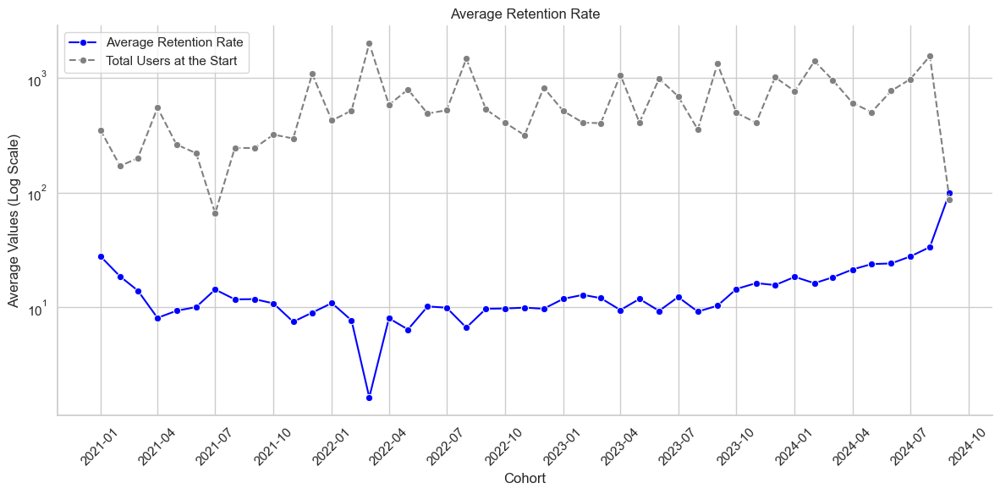

In [74]:
# Convert the 'month' column to datetime for convenience
df = rr_by_month_per_year
df['month'] = pd.to_datetime(df['cohort_month'])

plt.figure(figsize=(12, 6))

# Use logarithmic scale for the Y-axis
plt.yscale('log')

# Line for Average Retention Rate
sns.lineplot(data=df, x='month', y='average_retention_rate', marker='o', label='Average Retention Rate', 
             color='blue')
sns.lineplot(data=df, x='month', y='total_users', marker='o', label='Total Users at the Start', color='gray', 
             linestyle='--', markersize=6)

# Set major ticks on the x-axis
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 

# Plot settings
plt.title('Average Retention Rate')
plt.xlabel('Cohort')
plt.ylabel('Average Values (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
sns.despine()

# Show the plot
plt.show()

In [75]:
# Define the cohort names in the top 5 and the outsiders by retention (for cohorts with a lifetime of 
# more than 12 months)
some_functions.execute_query(sqls_script.top_bottom_5_cohorts_by_rr)

,cohort_month,total_users,average_retention_rate,category
0,2021-01,353,27.92,top
1,2021-02,171,18.62,top
2,2023-10,497,14.47,top
3,2021-07,66,14.30,top
4,2021-03,200,14.00,top
5,2022-02,520,7.70,bottom
6,2021-11,297,7.48,bottom
7,2022-08,1472,6.66,bottom
8,2022-05,794,6.41,bottom
9,2022-03,2004,1.64,bottom


<span style="color:blue; font-size:17px">Average number of purchases for users by cohorts</span>

In [76]:
avg_orders_by_cohorts = some_functions.execute_query(sqls_script.avg_orders_by_cohorts)
avg_orders_by_cohorts

,cohort_month,average_purchases_per_user
0,2021-01,16.93
1,2021-02,11.95
2,2021-03,8.49
3,2021-04,5.08
4,2021-05,5.67
5,2021-06,5.19
6,2021-07,8.56
7,2021-08,6.78
8,2021-09,5.90
9,2021-10,5.73


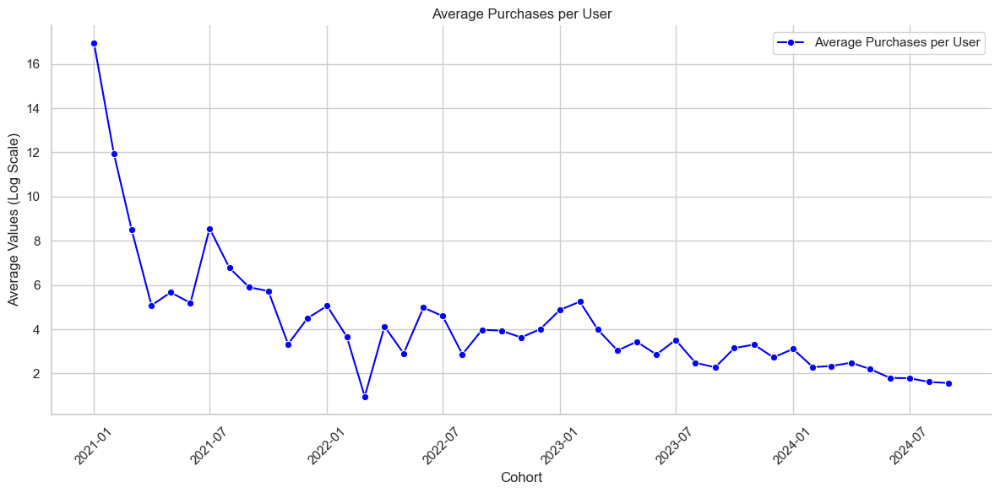

In [77]:
# Convert the 'month' column to datetime for convenience
df = avg_orders_by_cohorts
df['month'] = pd.to_datetime(df['cohort_month'])

plt.figure(figsize=(12, 6))

# Line for Average Retention Rate
sns.lineplot(data=df, x='month', y='average_purchases_per_user', marker='o', label='Average Purchases per User',
             color='blue')

# Plot settings
plt.title('Average Purchases per User')
plt.xlabel('Cohort')
plt.ylabel('Average Values (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
sns.despine()

# Show the plot
plt.show()

In [78]:
# Top-5 cohorts and 5 outsider cohorts by average donations
some_functions.execute_query(sqls_script.top_bottom_5_avg_orders_by_cohort)

,cohort_month,average_purchases_per_user,category
0,2021-01,16.93,top
1,2021-02,11.95,top
2,2021-07,8.56,top
3,2021-03,8.49,top
4,2021-08,6.78,top
5,2024-06,1.80,bottom
6,2024-07,1.79,bottom
7,2024-08,1.62,bottom
8,2024-09,1.57,bottom
9,2022-03,0.96,bottom


In [79]:
# Average number of purchases across all cohorts
some_functions.execute_query(sqls_script.avg_orders_by_all_cohorts)

,overall_average_purchases
0,4.29


<span style="color:blue; font-size:17px">Average check by cohorts</span>

In [80]:
# Calculate the average check by cohorts 
avg_check_by_cohorts = some_functions.execute_query(sqls_script.avg_check_by_cohorts)
# Rearranges the columns of a DataFrame by keeping the first two columns in place and reversing 
# the order of the remaining columns
avg_check_by_cohorts = some_functions.rearrange_columns(avg_check_by_cohorts)
avg_check_by_cohorts

,cohort,n_customers_start,average_cohort_check,2024-09,2024-08,2024-07,2024-06,2024-05,2024-04,2024-03,2024-02,2024-01,2023-12,2023-11,2023-10,2023-09,2023-08,2023-07,2023-06,2023-05,2023-04,2023-03,2023-02,2023-01,2022-12,2022-11,2022-10,2022-09,2022-08,2022-07,2022-06,2022-05,2022-04,2022-03,2022-02,2022-01,2021-12,2021-11,2021-10,2021-09,2021-08,2021-07,2021-06,2021-05,2021-04,2021-03,2021-02,2021-01
0,2021-01,353,1265.79,710.92,1167.81,1136.29,1062.66,1019.87,861.11,1132.79,941.14,1216.25,1379.73,1113.42,1573.31,4527.03,1402.80,1590.47,1198.94,1714.63,1038.24,1767.48,1576.09,2351.43,2331.94,721.76,830.23,876.87,994.27,1198.15,1339.51,1498.48,4351.09,1571.15,691.89,708.08,756.77,717.83,699.43,759.27,791.19,826.20,664.17,756.06,691.59,701.33,748.96,1251.87
1,2021-02,171,1109.53,300.00,597.11,2916.17,467.30,596.95,994.54,929.35,698.00,1072.83,1569.90,925.81,1070.30,533.36,547.61,1255.80,796.46,1622.96,1098.38,1162.39,661.80,2879.93,1101.10,502.28,2404.50,1026.26,1000.97,1705.96,518.61,494.29,876.47,508.13,1554.52,696.39,939.68,641.18,640.10,710.12,1406.38,2392.86,1561.84,1632.02,1464.29,1315.94,1028.27,NaN
2,2021-03,200,912.91,628.57,895.65,589.13,473.91,670.83,878.26,791.30,1065.00,392.35,1336.82,537.73,428.00,694.00,686.09,619.05,868.52,588.46,783.33,684.62,1685.71,699.00,677.89,490.12,383.97,384.73,355.67,1492.39,335.29,807.69,1800.67,1576.33,1931.06,752.28,1672.58,533.46,1299.11,1577.72,1117.18,1146.73,885.92,1379.21,934.39,1724.38,NaN,NaN
3,2021-04,551,1342.22,1681.43,1692.86,1346.90,1381.52,1558.57,1465.88,1898.33,1039.58,932.91,2375.04,1737.86,2160.59,980.00,2191.75,1090.94,1689.81,1716.13,1765.00,1957.00,1625.38,1676.40,1446.27,835.53,1632.11,958.29,1045.64,791.67,1297.76,582.22,1340.87,1748.89,541.75,586.23,1177.31,544.69,602.58,937.18,760.48,1042.50,566.64,1429.42,2541.25,NaN,NaN,NaN
4,2021-05,263,823.03,587.50,834.62,721.54,1416.43,470.53,677.78,468.00,789.57,420.77,890.64,557.00,1212.65,1123.13,1409.41,872.00,2138.47,1635.00,1905.00,2497.27,1417.00,1121.43,1035.63,895.22,360.96,478.21,783.85,390.00,446.00,659.55,332.14,583.33,356.03,532.86,298.16,374.77,563.59,371.07,569.18,424.85,521.73,601.54,NaN,NaN,NaN,NaN
5,2021-06,221,611.45,333.33,641.88,586.47,694.67,521.33,797.14,527.37,454.67,489.69,1204.21,561.67,939.94,730.00,521.33,940.00,680.91,850.00,1233.89,582.31,450.00,404.44,436.36,338.70,539.00,478.95,1220.00,633.33,360.00,395.45,330.00,481.19,416.85,738.65,803.44,252.50,1390.93,253.75,384.03,343.00,516.72,NaN,NaN,NaN,NaN,NaN
6,2021-07,66,1312.45,300.00,656.25,321.43,321.43,321.43,291.67,291.67,250.00,318.75,2150.00,762.50,1127.78,520.00,1092.86,1994.44,1091.67,3266.67,2034.83,12874.33,2000.00,2100.00,902.43,480.56,395.00,565.00,738.91,1416.67,2080.00,1225.00,2150.00,655.00,523.33,631.00,596.43,525.00,614.88,644.29,696.87,2257.47,NaN,NaN,NaN,NaN,NaN,NaN
7,2021-08,246,701.14,166.67,608.33,370.24,1217.31,856.00,918.97,600.00,495.42,588.00,1086.36,1106.50,819.57,639.23,659.09,602.17,913.64,543.57,754.08,1280.56,1079.00,187.00,2107.89,432.14,488.64,453.04,568.52,610.38,523.57,514.72,377.64,421.20,492.19,411.29,554.37,678.75,612.12,1058.57,846.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2021-09,245,795.30,200.00,592.86,737.50,709.62,412.93,566.67,589.63,395.83,680.85,688.04,877.27,489.58,795.65,617.86,735.00,853.70,630.00,550.00,576.80,755.00,558.33,2530.88,3235.69,950.58,602.27,463.00,1182.63,616.52,754.23,1765.67,666.76,452.74,667.26,754.88,506.67,471.94,791.16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2021-10,321,838.83,877.50,543.21,551.17,798.00,1005.00,817.20,759.71,363.31,482.67,1788.75,696.85,814.35,1696.71,1284.24,1103.82,1148.75,791.78,836.00,766.11,561.00,721.44,1351.63,766.57,922.33,651.25,612.03,887.14,391.54,555.56,376.92,735.46,524.65,878.55,1332.02,841.09,963.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


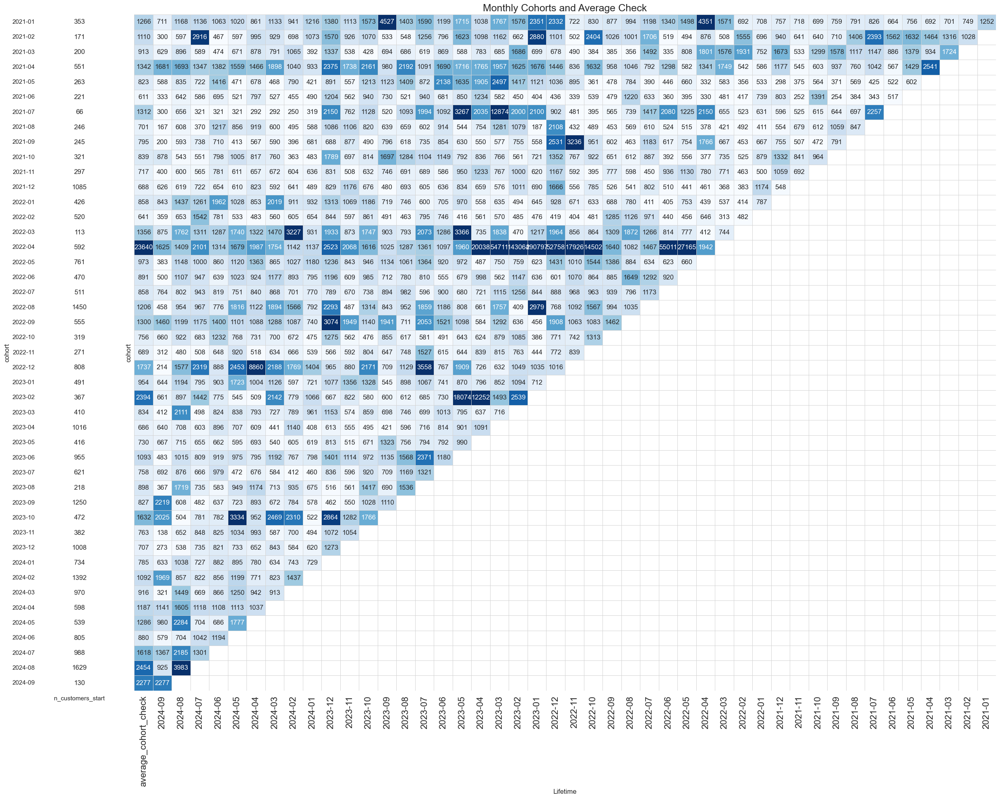

In [81]:
# Visualize the average check by cohort matrix
# Set 'cohort' as the index
avg_check_by_cohorts.set_index('cohort', inplace=True)
    
avg_check_values = avg_check_by_cohorts.drop(columns=['n_customers_start'])

# Set up the color map with defined limits
with sns.axes_style("white"):
    fig, ax = plt.subplots(1, 2, figsize=(25, 20), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

    # Heatmap for the average check by cohorts matrix
    sns.heatmap(avg_check_values,
                mask=avg_check_values.isnull(),
                annot=True,
                fmt='.0f',
                cmap='Blues',
                ax=ax[1],
                vmin=500,  
                vmax=3000, 
                linewidths=0.5,
                linecolor='lightgrey',
                cbar=False)
    ax[1].set_title('Monthly Cohorts and Average Check', fontsize=18)
    ax[1].set(xlabel='Lifetime')
    ax[1].tick_params(axis='x', labelsize=16) 
    ax[1].tick_params(axis='y', labelsize=16)

    # Cohort size
    cohort_size_df = avg_check_by_cohorts[['n_customers_start']]
    white_cmap = mcolors.ListedColormap(['white'])
    sns.heatmap(cohort_size_df,
                annot=True,
                cbar=False,
                fmt='g',
                cmap=white_cmap,
                ax=ax[0])

    fig.tight_layout()
    plt.show()

In [82]:
#  Calculate the average monthly check by cohorts 
avg_check_by_cohorts_by_month = some_functions.execute_query(sqls_script.avg_check_by_cohorts_by_month)
avg_check_by_cohorts_by_month

,cohort,average_check
0,2021-01,1265.79
1,2021-02,1109.53
2,2021-03,912.91
3,2021-04,1342.22
4,2021-05,823.03
5,2021-06,611.45
6,2021-07,1312.45
7,2021-08,701.14
8,2021-09,795.30
9,2021-10,838.83


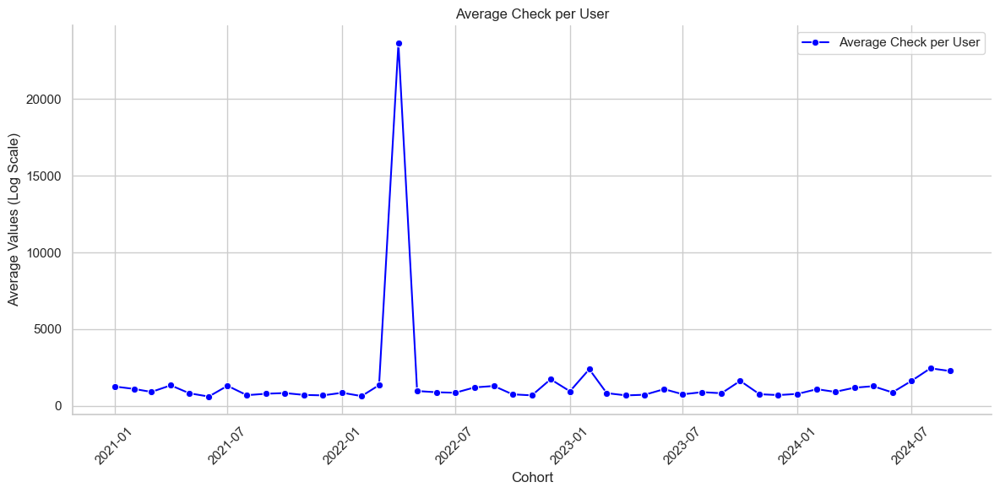

In [83]:
# Convert the 'month' column to datetime for convenience
df = avg_check_by_cohorts_by_month
df['month'] = pd.to_datetime(df['cohort'])

plt.figure(figsize=(12, 6))

# Line for Average Retention Rate
sns.lineplot(data=df, x='month', y='average_check', marker='o', label='Average Check per User', color='blue')

# Plot settings
plt.title('Average Check per User')
plt.xlabel('Cohort')
plt.ylabel('Average Values (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
sns.despine()

# Show the plot
plt.show()

In [84]:
# Top 5 cohorts and 5 cohort outsiders by average check
some_functions.execute_query(sqls_script.top_bottom_5_cohorts_by_avg_check)

,cohort,average_check,top_or_bottom
0,2022-04,23639.60,top
1,2024-08,2453.62,top
2,2023-02,2393.51,top
3,2024-09,2276.54,top
4,2022-12,1737.13,top
5,2022-11,688.81,bottom
6,2021-12,688.26,bottom
7,2023-04,686.32,bottom
8,2022-02,640.57,bottom
9,2021-06,611.45,bottom


<span style="color:blue; font-size:17px">LTV (lifetime value) by cohorts with accumulation</span>

In [85]:
ltv_cumsum_by_cohorts = some_functions.execute_query(sqls_script.ltv_cumsum_by_cohorts)
# Rearranges the columns of a DataFrame by keeping the first two columns in place and reversing 
# the order of the remaining columns
ltv_cumsum_by_cohorts = some_functions.rearrange_columns(ltv_cumsum_by_cohorts)
ltv_cumsum_by_cohorts

,cohort,n_customers_start,2024-09,2024-08,2024-07,2024-06,2024-05,2024-04,2024-03,2024-02,2024-01,2023-12,2023-11,2023-10,2023-09,2023-08,2023-07,2023-06,2023-05,2023-04,2023-03,2023-02,2023-01,2022-12,2022-11,2022-10,2022-09,2022-08,2022-07,2022-06,2022-05,2022-04,2022-03,2022-02,2022-01,2021-12,2021-11,2021-10,2021-09,2021-08,2021-07,2021-06,2021-05,2021-04,2021-03,2021-02,2021-01
0,2021-01,1,4544973.0,4535731.0,4462159.0,4391709.0,4323699.0,4262507.0,4216007.0,4146907.0,4093262.0,4025152.0,3949267.0,3875781.0,3782956.0,3520388.0,3437623.0,3353328.0,3296978.0,3242110.0,3206810.0,3159088.0,3122838.0,3068755.0,2959154.0,2874708.0,2777571.0,2667962.0,2539701.0,2507351.0,2460468.0,2417012.0,2277777.0,2123804.0,2016561.0,1903977.0,1780624.0,1667924.0,1555315.0,1423962.0,1288669.0,1153998.0,1035111.0,895996.0,759062.0,609678.0,441910.0
1,2021-02,1,1594333.0,1593433.0,1582685.0,1512697.0,1501949.0,1488816.0,1462958.0,1438795.0,1420647.0,1394899.0,1361931.0,1337860.0,1308962.0,1295628.0,1283033.0,1245359.0,1226244.0,1188916.0,1165850.0,1144927.0,1138309.0,1097990.0,1075968.0,1059895.0,973333.0,938440.0,902405.0,858050.0,848715.0,838335.0,823435.0,811240.0,745950.0,720880.0,676715.0,654915.0,624190.0,595075.0,528975.0,445225.0,385875.0,317330.0,245580.0,175835.0,NaN
2,2021-03,1,1274301.0,1269901.0,1249301.0,1235751.0,1224851.0,1208751.0,1188551.0,1170351.0,1141596.0,1134926.0,1105516.0,1093686.0,1082986.0,1065636.0,1049856.0,1036856.0,1013406.0,1005756.0,1001056.0,992156.0,980356.0,971968.0,959088.0,946835.0,934932.0,924929.0,915326.0,888463.0,882763.0,872263.0,845253.0,812150.0,752287.0,728214.0,661311.0,648508.0,603039.0,546241.0,503788.0,473973.0,439422.0,392529.0,344875.0,NaN,NaN
3,2021-04,1,3079334.0,3067564.0,3008314.0,2969254.0,2923664.0,2869114.0,2819274.0,2750934.0,2716628.0,2686775.0,2632149.0,2567848.0,2494388.0,2464008.0,2376338.0,2341428.0,2295803.0,2242603.0,2210833.0,2171693.0,2150563.0,2108653.0,2065265.0,2035186.0,1973166.0,1933876.0,1893096.0,1874096.0,1836461.0,1825981.0,1795141.0,1747921.0,1726251.0,1703388.0,1642168.0,1624738.0,1606058.0,1569508.0,1533005.0,1495475.0,1468843.0,1400231.0,NaN,NaN,NaN
4,2021-05,1,695289.0,692939.0,682089.0,672709.0,652879.0,643939.0,631739.0,624719.0,613665.0,608195.0,595726.0,590156.0,569541.0,551571.0,527611.0,514531.0,482454.0,459564.0,444324.0,416854.0,402684.0,394834.0,386549.0,365959.0,356213.0,342823.0,322443.0,319323.0,312633.0,305378.0,303053.0,292553.0,281872.0,266952.0,257411.0,246168.0,221370.0,210609.0,188980.0,177509.0,158205.0,NaN,NaN,NaN,NaN
5,2021-06,1,527761.0,526761.0,516491.0,506521.0,496101.0,488281.0,477121.0,467101.0,460281.0,452446.0,429566.0,421141.0,405162.0,394942.0,387122.0,370202.0,362712.0,354212.0,343107.0,335537.0,332387.0,328747.0,323947.0,317173.0,305315.0,296215.0,271815.0,266115.0,262515.0,258165.0,256515.0,246410.0,235155.0,215950.0,190240.0,184685.0,147130.0,140025.0,126200.0,114195.0,NaN,NaN,NaN,NaN,NaN
6,2021-07,1,419579.0,419279.0,414029.0,411779.0,409529.0,407279.0,405529.0,403779.0,402029.0,399479.0,395179.0,389079.0,378929.0,374249.0,366599.0,348649.0,342099.0,332299.0,320090.0,281467.0,279467.0,273167.0,266850.0,262525.0,258575.0,252925.0,244797.0,240547.0,230147.0,225247.0,220947.0,214397.0,208117.0,198652.0,190302.0,180852.0,170399.0,159446.0,148993.0,NaN,NaN,NaN,NaN,NaN,NaN
7,2021-08,1,806859.0,806359.0,791759.0,783984.0,752334.0,730934.0,704284.0,686284.0,674394.0,659694.0,635794.0,613664.0,594814.0,578194.0,563694.0,549844.0,529744.0,514524.0,504721.0,481671.0,469802.0,467932.0,427882.0,418807.0,406591.0,393906.0,378556.0,368790.0,361460.0,352195.0,346908.0,338484.0,322734.0,309984.0,287255.0,265535.0,245335.0,208285.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2021-09,1,843084.0,842884.0,830434.0,815684.0,797234.0,785259.0,771659.0,755739.0,746239.0,727856.0,712031.0,692731.0,680981.0,662681.0,645381.0,630681.0,607631.0,598181.0,594881.0,589113.0,581563.0,578213.0,535188.0,451060.0,426345.0,406470.0,390265.0,361882.0,348935.0,339130.0,312645.0,3

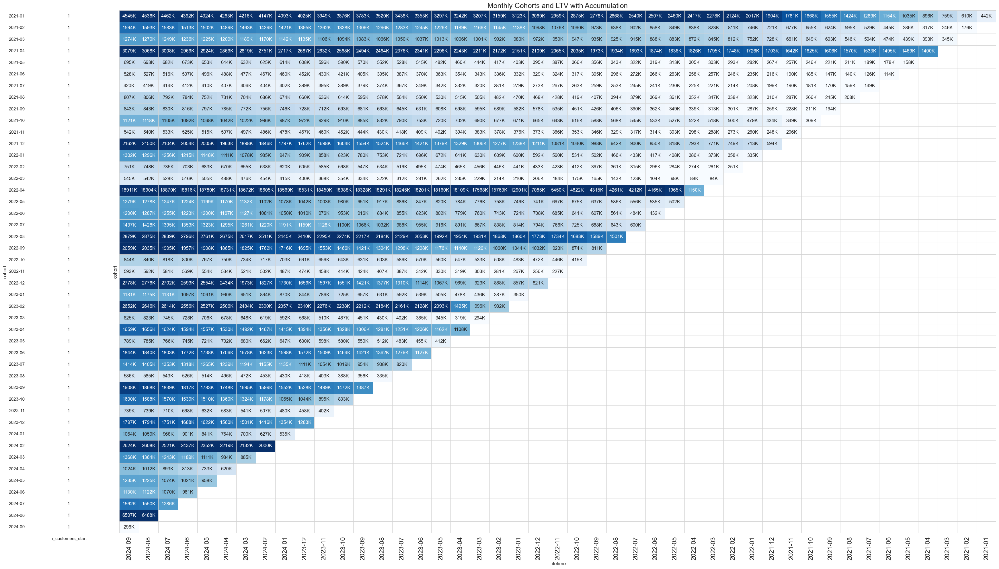

In [86]:
# Visualize the ltv matrix
# Set 'cohort' as the index
ltv_cumsum_by_cohorts.set_index('cohort', inplace=True)
    
ltv_values = ltv_cumsum_by_cohorts.drop(columns=['n_customers_start'])

# Set up the color map with defined limits
with sns.axes_style("white"):
    fig, ax = plt.subplots(1, 2, figsize=(35, 20), sharey=True, gridspec_kw={'width_ratios': [1, 11]})

    # Heatmap for the average check by cohorts matrix
    sns.heatmap(ltv_values,
                mask=ltv_values.isnull(),
                annot=ltv_values.applymap(lambda x: f"{x/1000:.0f}K" if pd.notnull(x) else ""),
                fmt='',
                cmap='Blues',
                ax=ax[1],
                vmin=300000,  
                vmax=2000000, 
                linewidths=0.5,
                linecolor='lightgrey',
                cbar=False)
    ax[1].set_title('Monthly Cohorts and LTV with Accumulation', fontsize=18)
    ax[1].set(xlabel='Lifetime')
    ax[1].tick_params(axis='x', labelsize=16) 
    ax[1].tick_params(axis='y', labelsize=16)

    # Cohort size
    cohort_size_df = ltv_cumsum_by_cohorts[['n_customers_start']]
    white_cmap = mcolors.ListedColormap(['white'])
    sns.heatmap(cohort_size_df,
                annot=True,
                cbar=False,
                fmt='g',
                cmap=white_cmap,
                ax=ax[0])
    plt.xticks(rotation=90)
    fig.tight_layout()
    plt.show()

In [87]:
# LTV calculation by day
some_functions.execute_query(sqls_script.ltv_cumsum_by_cohorts_by_day)

,cohort,n_customers_start,order_month,ltv
0,2021-01,353,2021-01,441910
1,2021-01,353,2021-02,609678
2,2021-01,353,2021-03,759062
3,2021-01,353,2021-04,895996
4,2021-01,353,2021-05,1035111
...,...,...,...,...
1030,2024-07,988,2024-08,1550080
1031,2024-07,988,2024-09,1562380
1032,2024-08,1629,2024-08,6487601
1033,2024-08,1629,2024-09,6507019


In [88]:
# Cumulative LTV Calculation by Cohorts
ltv_cumsum_by_cohorts_by_month = some_functions.execute_query(sqls_script.ltv_cumsum_by_cohorts_by_month)
ltv_cumsum_by_cohorts_by_month

,cohort,ltv
0,2021-01,4544973.0
1,2021-02,1594333.0
2,2021-03,1274301.0
3,2021-04,3079334.0
4,2021-05,695289.0
5,2021-06,527761.0
6,2021-07,419579.0
7,2021-08,806859.0
8,2021-09,843084.0
9,2021-10,1121306.0


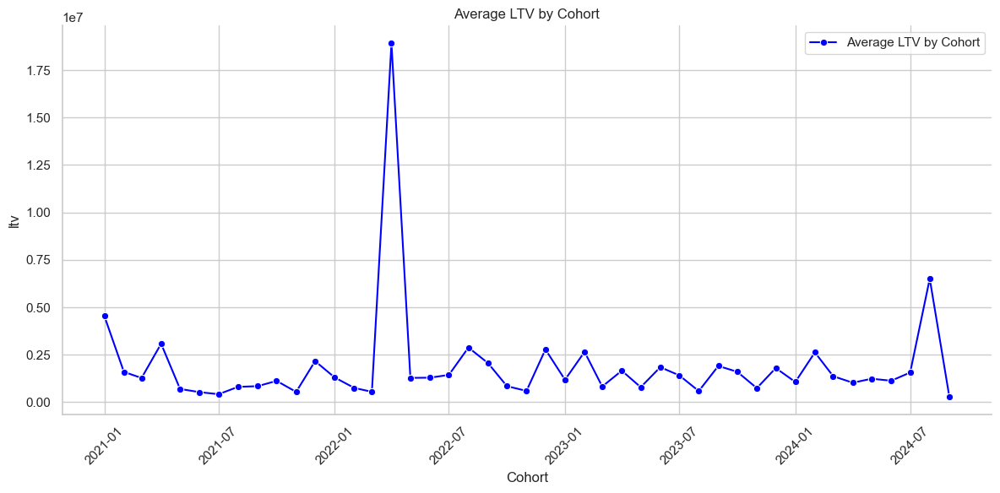

In [89]:
# Convert the 'month' column to datetime for convenience
df = ltv_cumsum_by_cohorts_by_month
df['month'] = pd.to_datetime(df['cohort'])

plt.figure(figsize=(12, 6))

# Line for Average Retention Rate
sns.lineplot(data=df, x='month', y='ltv', marker='o', label='Average LTV by Cohort', color='blue')

# Plot settings
plt.title('Average LTV by Cohort')
plt.xlabel('Cohort')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
sns.despine()

# Show the plot
plt.show()

In [90]:
# Top-5 Cohorts and 5 Cohorts Outsiders by LTV
some_functions.execute_query(sqls_script.top_bottom_5_cohorts_by_ltv)

,cohort,ltv,category
0,2022-04,18910510.0,top
1,2024-08,6507019.0,top
2,2021-01,4544973.0,top
3,2021-04,3079334.0,top
4,2022-08,2879104.0,top
5,2022-03,545097.0,bottom
6,2021-11,541515.0,bottom
7,2021-06,527761.0,bottom
8,2021-07,419579.0,bottom
9,2024-09,295950.0,bottom


<span style="color:blue; font-size:17px">Conclusions:</span>

Here are the conclusions drawn during the targeted data analysis stage:
- User Metrics:
  - The number of unique users in the customers and orders datasets differs: there are 2,457 records present only in customers and 30 records present only in orders;
  - The New Year promotion lasted from November 13, 2023, to February 9, 2024;
  - Users participating in the New Year promotion were attracted in different years, with the most active being those who joined in 2023;
  - A total of 1,210 users participated in the promotion, which is 4.6% of the total user base;
  - The number of new users attracted specifically by this promotion was 634, with 154 (24%) returning for a repeat donation;
  - Not all donations added to the cart were completed;
  - Among the so-called "historical" users, the percentage of completed donations is significantly higher (81.3%-85.5%) compared to those who joined in 2023 and 2024 (71.9%-75.6%);
  - There are 1,437 recurring users, with their numbers declining each year (679 in 2022, 460 in 2023, and 298 in 2024);
  - A total of 9,430 users made at least one repeat payment (excluding recurring users), with an average of 111 days between such payments;
  - The main source of user acquisition across all years is the foundation's website, with the number of acquired users increasing year on year. Various social media platforms have performed significantly worse, with VK, Instagram, and Yandex leading among them;
  - Just under one-third of payments were not completed or encountered errors during payment processing;
  - There is no data on unpaid orders for the year 2021. The number of users experiencing payment errors increased after 2022, and the volume of unpaid orders more than doubled. This issue is likely due to problems with bank transfers (possibly from abroad) related to sanctions;
  - In 2023, the total amount of unpaid orders doubled and exceeded the amount of paid orders;
  - The largest single donation was 200,000 rubles;
  - The foundation has one unpaid donation amounting to 1,100,000 rubles, with 4,503 unpaid donations ranging from an average of 500 rubles to 200,000 rubles;
  - In 2023 and 2024, the VK channel saw significant growth in user acquisition, while Instagram dropped out of the top five sources post-2022;
  - The average donation amount from VK is the lowest, although they compensate for it with higher user numbers contributing to total collection amounts. Instagram led in average donation amounts in 2022. The aif_gazeta and Yandex.Direct channels appear to be promising avenues for development in 2023 and 2024;
  - Users in 2024 show higher activity in DAU, WAU, MAU, and Sticky Factor metrics, which may indicate successful marketing campaigns.
- Marketing Metrics:
  - The Conversion Rate between users and paying users stands at 13.9%;
  - Given that data for 2024 is incomplete, it can be said that the lifetime value of users is increasing year on year (2021 - 1,373.98 rubles, 2022 - 1,708.15 rubles, 2023 - 2,015.32 rubles, 2024 - 1,824.08 rubles).
- Commercial Metrics:
  - The total amount collected over four years is 51,681,132 rubles;
  - Collections have been increasing each year: in the incomplete year of 2024, 17,968,806 rubles were collected, compared to 7,583,698 rubles in 2021;
  - ARPU has decreased by 2024, likely due to a high volume of unpaid orders;
  - ARPPU, after two years of decline in 2022 and 2023, has reached the level of 2021 in 2024 and has already surpassed it;
  - The highest average check was in 2021 at 810.31 rubles, while it was the lowest in 2022 at 698.43 rubles; currently, in 2024, it stands at 754.86 rubles.
- RFM Analysis:
  - We segmented the users. The best segments are 333, 133, 323, 233, 243, 143, 343: these users frequently visit the website, often donate money, and have high transaction amounts. Segments 213, 112, 232, 214, 122, 113, 312 are also noteworthy. Segments 331, 321, 322 consist of often but law donations.
- Cohort Analysis:
  - The top five cohorts by retention rate over the entire period are: January 2021, February 2021, October 2023, July 2021, and March 2021;
  - The bottom five cohorts by retention rate over the entire period are: February 2022, November 2021, August 2022, May 2022, and March 2021;
  - The average number of purchases per user is 4.3;
  - The top five cohorts by average check over the entire period are: April 2022, August 2024, February 2023, September 2024, and December 2022;
  - The bottom five cohorts by average check over the entire period are: November 2022, December 2021, April 2023, February 2022, and June 2021;
  - The top five cohorts by LTV (lifetime value of users) over the entire period are: April 2022, August 2024, January 2021, April 2021, and August 2022;
  - The bottom five cohorts by LTV (lifetime value of users) over the entire period are: March 2022, November 2021, June 2021, July 2021, and September 2024.

[Return to project description](#toc)

<a id="11"></a>
## General Conclusion

We analyzed the data of the charity fund "AiF. Kind Heart" with the aim of studying user behavior, segmenting users, calculating user, marketing, and commercial metrics, and conducting cohort analysis.

***The research consisted of the following stages:***

- ***Data Loading, Review, and Preprocessing:***
  - read the data files;
  - combined four user data files into the customers dataset;
  - displayed and examined the overall information about the datasets;
  - in the customers dataset:
    - removed the columns CustomerActionCustomerIdsWebsiteID, CustomerActionChannelIdsExternalId, CustomerActionCustomerIdsBackendID, CustomerActionBrandIdsSystemName, CustomerActionChannelIdsSystemName, and CustomerActionActionTemplateIdsSystemName;
    - changed the data types of CustomerActionDateTimeUtc and CustomerActionCreationDateTimeUtc to datetime.
  - in the orders dataset:
    - removed the columns OrderLineBasePricePerItem, OrderFirstActionChannelIdsExternalId, OrderLineId, OrderLineNumber, OrderCustomFieldsNextPayDate, OrderIdsBackendID, OrderAreaIdsExternalId, OrderCustomerIdsWebsiteID, OrderDeliveryCost, OrderLineLineId, OrderCustomerIdsBackendID, OrderLineGiftCardStatusIdsSystemName, OrderTransactionIdsExternalId, OrderLineLineNumber, and OrderLineGiftCardAmount;
    - changed the data type of OrderFirstActionDateTimeUtc to datetime.
  
- ***Exploratory Data Analysis:***
  - As part of the exploratory data analysis stage, we utilized the ydata_profiling library for report generation. The following changes and conclusions were made:
    - Customers dataset:
      - Analyzed general information about the dataset;
      - Examined unique values in the columns;
      - No duplicates were found;
      - Missing values (41.1% of the data) were identified in 5 columns that store information about marketing actions, sources of engagement, etc. The missing values were left unchanged, as they are likely related to a lack of information, possibly because data were not collected for some period.
    - Orders dataset:
      - Analyzed general information about the dataset;
      - Examined unique values in the columns;
      - It is possible that instead of being recorded in the OrderLineProductName column, the data "На уставную деятельность" was entered into the OrderLineProductIdsWebsite column as an ID, which creates confusion in the data;
      - No duplicates were found;
      - Missing values (17.8% of the data) were identified in 3 columns. The missing values were left unchanged, as they are likely related either to a lack of user information or to the fact that only users for whom the binary columns had a true value were marked.  
  - Processed files were saved in .csv format.

- ***Target Data Analysis:***
  - User Metrics:
    - The number of unique users in the customers and orders datasets differs: there are 2,457 records present only in customers and 30 records present only in orders;
    - The New Year promotion lasted from November 13, 2023, to February 9, 2024;
    - Users participating in the New Year promotion were attracted in different years, with the most active being those who joined in 2023;
    - A total of 1,210 users participated in the promotion, which is 4.6% of the total user base;
    - The number of new users attracted specifically by this promotion was 634, with 154 (24%) returning for a repeat donation;
    - Not all donations added to the cart were completed;
    - Among the so-called "historical" users, the percentage of completed donations is significantly higher (81.3%-85.5%) compared to those who joined in 2023 and 2024 (71.9%-75.6%);
    - There are 1,437 recurring users, with their numbers declining each year (679 in 2022, 460 in 2023, and 298 in 2024);
    - A total of 9,430 users made at least one repeat payment (excluding recurring users), with an average of 111 days between such payments;
    - The main source of user acquisition across all years is the foundation's website, with the number of acquired users increasing year on year. Various social media platforms have performed significantly worse, with VK, Instagram, and Yandex leading among them;
    - Just under one-third of payments were not completed or encountered errors during payment processing;
    - There is no data on unpaid orders for the year 2021. The number of users experiencing payment errors increased after 2022, and the volume of unpaid orders more than doubled. This issue is likely due to problems with bank transfers (possibly from abroad) related to sanctions;
    - In 2023, the total amount of unpaid orders doubled and exceeded the amount of paid orders;
    - The largest single donation was 200,000 rubles;
    - The foundation has one unpaid donation amounting to 1,100,000 rubles, with 4,503 unpaid donations ranging from an average of 500 rubles to 200,000 rubles;
    - In 2023 and 2024, the VK channel saw significant growth in user acquisition, while Instagram dropped out of the top five sources post-2022;
    - The average donation amount from VK is the lowest, although they compensate for it with higher user numbers contributing to total collection amounts. Instagram led in average donation amounts in 2022. The aif_gazeta and Yandex.Direct channels appear to be promising avenues for development in 2023 and 2024;
    - Users in 2024 show higher activity in DAU, WAU, MAU, and Sticky Factor metrics, which may indicate successful marketing campaigns.
  - Marketing Metrics:
    - The Conversion Rate between users and paying users stands at 13.9%;
    - Given that data for 2024 is incomplete, it can be said that the lifetime value of users is increasing year on year (2021 - 1,373.98 rubles, 2022 - 1,708.15 rubles, 2023 - 2,015.32 rubles, 2024 - 1,824.08 rubles).
  - Commercial Metrics:
    - The total amount collected over four years is 51,681,132 rubles;
    - Collections have been increasing each year: in the incomplete year of 2024, 17,968,806 rubles were collected, compared to 7,583,698 rubles in 2021;
    - ARPU has decreased by 2024, likely due to a high volume of unpaid orders;
    - ARPPU, after two years of decline in 2022 and 2023, has reached the level of 2021 in 2024 and has already surpassed it;
    - The highest average check was in 2021 at 810.31 rubles, while it was the lowest in 2022 at 698.43 rubles; currently, in 2024, it stands at 754.86 rubles.
  - RFM Analysis:
    - We segmented the users. The best segments are 333, 133, 323, 233, 243, 143, 343: these users frequently visit the website, often donate money, and have high transaction amounts. Segments 213, 112, 232, 214, 122, 113, 312 are also noteworthy. Segments 331, 321, 322 consist of often but law donations.
  - Cohort Analysis:
    - The top five cohorts by retention rate over the entire period are: January 2021, February 2021, October 2023, July 2021, and March 2021;
    - The bottom five cohorts by retention rate over the entire period are: February 2022, November 2021, August 2022, May 2022, and March 2021;
    - The average number of purchases per user is 4.3;
    - The top five cohorts by average check over the entire period are: April 2022, August 2024, February 2023, September 2024, and December 2022;
    - The bottom five cohorts by average check over the entire period are: November 2022, December 2021, April 2023, February 2022, and June 2021;
    - The top five cohorts by LTV (lifetime value of users) over the entire period are: April 2022, August 2024, January 2021, April 2021, and August 2022;
    - The bottom five cohorts by LTV (lifetime value of users) over the entire period are: March 2022, November 2021, June 2021, July 2021, and September 2024.
   
- ***Recommendations for the client:***
  - pay attention to the incorrect distribution of data in the OrderLineProductName and OrderLineProductIdsWebsite columns;
  - monitor unpaid orders; if a user adds a product to their cart but does not complete the payment, consider setting up reminder emails for abandoned carts. It is important to engage with these users, as the amounts of unpaid orders exceed the annual collections;
  - continue working on New Year promotions to attract additional funds from users. The analysis showed a good response from new users to these promotions;
  - develop acquisition channels such as yandex-direct, aif_gazeta, and mtsmarketolog. These channels bring in users who donate larger amounts compared to VK;
  - try to reactivate historical users, as there are many significant donors among them.

[Return to project description](#toc)